<h1> O Mercado Imobiliário e suas Premissas </h1>

Comprar um imóvel tem suas vantagens e desvantagens. É necessário conhecer os riscos do mercado imobiliário e o que fazer para reduzi-los. Afinal, problemas sempre podem ocorrer, mas devemos fazer o máximo de esforço para evitá-los.

Quando uma empresa desenvolve um empreendimento imobiliário, ela contrata profissionais de vendas e marketing, que estão tecnicamente preparados para mostrar **apenas vantagens e pontos positivos** do produto. Porém, quando a finalidade é **comprar imóveis para investimentos**, uma análise mais profunda tem que ser considerada assumindo algumas premissas.

![casa](image/casa.jpg)

Desta forma, por meio destas práticas, empresas do setor imobiliário enfrentam desafios para conseguir os melhores resultados em seus negócios. E com a empresa **House Rocket Company** não é diferente.

<h1>O Desafio da House Rocket Company</h1>

A House Rocket é uma plataforma digital que tem como modelo de negócio, a compra e a venda de imóveis usando tecnologia.

A empresa, por meio do seu CEO, gostaria de maximizar sua receita encontrando boas oportunidades de negócio no Condado King, Washington, Estados Unidos. Para isso, a sua principal estratégia é comprar imóveis em boas condições e ótimas localizações, com preços abaixo do mercado, para posteriormente revendê-las à preços mais atrativos visando o lucro. Quanto maior a diferença entre a compra e venda, maior o lucro da empresa e assim maior sua receita.

Entretanto, as casas possuem caracteristicas que as tornam mais ou menos atrativas aos compradores e vendedores. Por exemplo, a localização e a área interna do imóvel.

Portanto, o CEO solicitou a realização de um trabalho de **Análise Exploratória de Dados** para responder três perguntas fundamentais para uma futura tomada de decisão. São elas:

- **Quais casas o CEO da House Rocket deveria comprar e por qual preço de compra?**


- **Uma vez a casa em posse da empresa, qual o melhor momento para vendê-las e qual seria o preço da venda?**


- **A House Rocket deveria fazer uma reforma para aumentar o preço da venda? Quais seriam as sugestões de mudanças?**

<h1>Apresentando os Dados</h1>

Esse trabalho estará utilizando  o conjunto de dados disponível neste <a href='https://www.kaggle.com/harlfoxem/housesalesprediction'>link</a>.

<h1>Objetivos</h1>

Com base nas informações dispostas nesse conjunto de dados, os objetivos deste trabalho além de responder as perguntas propostas pelo CEO é:

- **Realizar insights.**


- **Escrever possíveis soluções para o desafio da House Rocket Company.** 


# 0.0 Importando Bibliotecas

In [1]:
%matplotlib inline
import pandas              as pd
import numpy               as np
import math
import seaborn             as sns
import matplotlib.pyplot   as plt
import plotly.express      as px
import plotly.graph_objs   as go
from IPython.core.display  import HTML
from IPython.display       import Image

## 0.1 Funções Auxiliares

In [2]:
# Configurando estilo da biblioteca Seaborn
sns.set_style('darkgrid')
sns.set_palette('muted')

pd.options.display.max_columns = None
pd.options.display.max_rows = 999

# Configurando o titulo e os rótulos
def set_plots_features(ax, title, xlabel, ylabel):
    ax.set_title(title, fontsize=18)
    ax.set_xlabel(xlabel, fontsize=14)
    ax.set_ylabel(ylabel, fontsize=14)

In [3]:
# Função filtro Região Montanhas
def mont(quartos, banheiros):
    filtro = montanhas[(montanhas['quartos']==quartos) & (montanhas['banheiros']==banheiros)]
    aux = filtro[['id', 'preco','quartos', 'banheiros', 'area_interna', 'nota','casa_com_porao']]
    a = round(aux['preco'].mean(),2)
        
    aux1 = aux[(aux['preco']<=aux['preco'].mean()) & (aux['area_interna']>=(aux['area_interna'].mean()*0.80)) & 
               (aux['nota']>=5)]
    aux1['valor abaixo da media (%)'] = round((1 - (aux['preco']/aux['preco'].mean()))*100,2)
    
    print(f'Preço Médio: US$ {a}' )
    return aux1.sort_values(by='valor abaixo da media (%)', ascending=False)

In [4]:
# Função filtro Região Norte
def nort(quartos, banheiros):
    filtro = norte[(norte['quartos']==quartos) & (norte['banheiros']==banheiros)]
    aux = filtro[['id', 'preco','quartos', 'banheiros', 'area_interna', 'nota','casa_com_porao']]
    a = round(aux['preco'].mean(),2)
        
    aux1 = aux[(aux['preco']<=aux['preco'].mean()) & (aux['area_interna']>=(aux['area_interna'].mean()*0.80)) & 
               (aux['nota']>=5)]
    aux1['valor abaixo da media (%)'] = round((1 - (aux['preco']/aux['preco'].mean()))*100,2)
    
    print(f'Preço Médio: US$ {a}' )
    return aux1.sort_values(by='valor abaixo da media (%)', ascending=False)


In [5]:
# Função filtro Região Sul
def su(quartos, banheiros):
    filtro = sul[(sul['quartos']==quartos) & (sul['banheiros']==banheiros)]
    aux = filtro[['id', 'preco','quartos', 'banheiros', 'area_interna', 'nota','casa_com_porao']]
    a = round(aux['preco'].mean(),2)
        
    aux1 = aux[(aux['preco']<=aux['preco'].mean()) & (aux['area_interna']>=(aux['area_interna'].mean()*0.80)) & 
               (aux['nota']>=5)]
    aux1['valor abaixo da media (%)'] = round((1 - (aux['preco']/aux['preco'].mean()))*100,2)
    
    print(f'Preço Médio: US$ {a}' )
    return aux1.sort_values(by='valor abaixo da media (%)', ascending=False)

## 0.2 Carregando Dados

In [6]:
df = pd.read_csv('C:/Users/diasn/DS/House_Sales/data/kc_house_data.csv')

# Visualizando Dados
df.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


Acima podemos conferir as primeiras linhas e colunas do conjunto de dados, onde os atributos estão nomeados em inglês. Devemos saber o que cada item significa. Logo, irei detalhar as características das variáveis propondo um dicionário de dados.

## 0.3 Dicionário de Dados

- **id:** identificação do imóvel vendido.


- **date:** data de venda da casa.


- **price:** preço de venda de cada casa.


- **bedrooms:** número de dormitórios.


- **bathrooms:** número de banheiros.

    * Banheiro completo principal (1) - contendo banheira, chuveiro, pia e vaso.

    * Banheiro 3/4 (0.75) - contendo chuveiro, pia e vaso.

    * Lavabo (0.5) - contendo pia e vaso.


- **sqft_living:** metragem quadrada do espaço interior da habitação.


- **sqft_lot:** metragem quadrada do lote.


- **floors:** número de níveis.


- **waterfront:** valor binário representando se a residência está localizada a beira-mar ou não.


- **view:** valor de 0-4 indica a qualidade da vista.


- **condition:** valor de 0 a 5 indica a condição da casa.

  - 1 = Pobre - Desgastado. Reparos e revisões necessárias em superfícies pintadas, coberturas, encanamentos, aquecimento e inúmeras inadequações funcionais. Manutenção e abuso diferidos excessivos, valor em uso limitado, abandono próximo ou reconstrução importante; reutilização ou mudança de ocupação é iminente. A idade efetiva está próxima do final da escala, independentemente da idade cronológica real.
  
  - 2 = Muito mal vestido. Muito reparo necessário. Muitos itens precisam de retoque ou revisão, manutenção adiada óbvia, utilidade e sistemas inadequados de construção, todos diminuindo a expectativa de vida e aumentando a idade efetiva.
  
  - 3 = Média - Algumas evidências de manutenção diferida e obsolescência normal com a idade, pois são necessários alguns pequenos reparos, além de bom - Não é necessária manutenção óbvia, mas nem tudo é novidade. Aparência e utilidade estão acima do padrão e a idade efetiva geral será menor que a propriedade típica e alguns retoques. Todos os principais componentes ainda funcionam e contribuem para uma expectativa de vida estendida. A idade e utilidade efetivas são padrão para propriedades semelhantes de sua classe e uso.
  
  - 4 = Bom - Não é necessária manutenção óbvia, mas nem tudo é novidade. Aparência e utilidade estão acima do padrão e a idade efetiva geral será menor que a propriedade típica.
  
  - 5 = Muito bom - Todos os itens são bem mantidos, muitos foram revisados ​​e reparados por apresentarem sinais de desgaste, aumentando a expectativa de vida e diminuindo a idade efetiva com pouca deterioração ou obsolescência evidente com alto grau de utilidade.


- **grade:** valor de 1 a 13 indica a qualidade de construção e acabamento do imóvel: 1-3 fica aquém da construção civil; 7 tem um nível médio de construção e design ; 11- 13 têm um alto nível de qualidade de construção e design.


- **sqft_above:** área superior ao porão


- **sqft_basement:** área do porão.


- **yr_built:** ano de construção.


- **yr_renovated:** ano de reforma.


- **zipcode:** código postal.


- **lat:** latitude.


- **long:** longitude.


- **sqft_living15 :** área do espaço de habitação interior para os 15 vizinhos mais próximos. 


- **sqft_lot15:** área dos lotes dos 15 vizinhos mais próximos.



# 1.0 Descrição dos Dados

Para começar, vamos nos familiarizar com o conjunto de dados fazendo a descrição dos dados, ou seja, irei explorar as características dos dados e trabalhar com os seguintes tópicos abaixo:

- Renomeação das Colunas


- Dimensão dos Dados


- Tipos dos Dados


- Verificação dos NAN


- Mudanças dos Tipos de Dados


- Estatística Descritiva


- Localização dos Imóveis

Porém, antes de prosseguir, a cada etapa finalizada, vou fazer uma cópia do conjunto de dados para não perder o que já for realizado. Esse procedimento facilita muito o trabalho, caso aconteça algo de errado com o código.

In [7]:
# Cópia do conjunto de dados
df1 = df.copy()

## 1.1 Renomeação das Colunas

Com a cópia do conjunto de dados devidamente realizada, o primeiro procedimento que vou fazer é a renomeação das colunas para português, pois, como foi visto, os atributos do dataset estão nomeados em inglês.

In [8]:
# Listando as colunas
df1.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15'],
      dtype='object')

In [9]:
# Renomeando colunas para português
df1.columns = ['id', 'data', 'preco', 'quartos', 'banheiros', 'area_interna', 'area_lote', 'niveis', 'vista_agua',
            'visualizacao', 'condicao', 'nota', 'area_acima', 'area_porao', 'ano_construcao', 'ano_reforma',
            'codigo', 'lat', 'long', 'area_interna15', 'area_lote15']

In [10]:
# Visualização do conjunto de dados com as colunas renomeadas
df1.head().T

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
data,20141013T000000,20141209T000000,20150225T000000,20141209T000000,20150218T000000
preco,221900,538000,180000,604000,510000
quartos,3,3,2,4,3
banheiros,1,2.25,1,3,2
area_interna,1180,2570,770,1960,1680
area_lote,5650,7242,10000,5000,8080
niveis,1,2,1,1,1
vista_agua,0,0,0,0,0
visualizacao,0,0,0,0,0


## 1.2 Dimensão dos Dados

Nessa etapa, descobrirei qual é o número de linhas e colunas dos dados para saber o tamanho real do dataset. Dessa forma, podemos identificar a dimensão dos dados aplicando o comando `shape`. 

In [11]:
print(f'Número de linhas:{df1.shape[0]}')
print(f'Número de colunas:{df1.shape[1]}')

Número de linhas:21613
Número de colunas:21


Observando os registros acima, verifico que o dataset tem cerca de 21613 imóveis com 21 caracteristicas cada um. Não é um conjunto de dados grande que exige a utilização de algum servidor ou' **cloud**.

## 1.3 Tipos de Dados

O próximo passo a considerar é sobre os tipos de dados que estou tratando, pois é de fundamental importância saber o aspecto de cada um. Portanto, utilizarei o comando `dtypes` para tal. 

In [12]:
df1.dtypes

id                  int64
data               object
preco             float64
quartos             int64
banheiros         float64
area_interna        int64
area_lote           int64
niveis            float64
vista_agua          int64
visualizacao        int64
condicao            int64
nota                int64
area_acima          int64
area_porao          int64
ano_construcao      int64
ano_reforma         int64
codigo              int64
lat               float64
long              float64
area_interna15      int64
area_lote15         int64
dtype: object

Analisando os tipos de dados, entendo que os atributos "data", "banheiros", "vista_agua" e "condicao" precisam ser modificados, pois não estão no formato ideal. O atributo "data" está em formato *object* e é preciso transformar para *datetime*.

O atributo "banheiro", que é do tipo float, é categorizado nos EUA considerando cada acessório como 1/4 do banheiro, isso está explicado no subitem **Dicionário de Dados**. Logo, para facilitar a contagem de banheiros no momento da Análise Exploratória de Dados, irei transformar o atributo em *interger* considerando o arredondamento dos números reais sempre para mais. 

Para o atributo "vista_agua" converterei os números binários (1 e 0) apenas para Sim e Não. E por fim, "condicao" receberá os nomes das categorias que cada número representa conforme o **Dicionário de Dados**.

In [13]:
# Convertendo atributo data para datetime
df1['data'] = pd.to_datetime(df1['data'])

# Convertendo Banheiros para unidade
df1['banheiros'] = df1['banheiros'].apply(lambda x: 1 if x==0.5 else math.ceil(x))

# Convertendo vista para agua
df1['vista_agua'] = df1['vista_agua'].apply(lambda x: 'Não' if x==0 else 'Sim')

# Convertendo condição
condicao = {1 : 'Pobre', 2: 'Justo', 3: 'Média', 4: 'Bom', 5: 'Muito Bom'}
df1['condicao'] = df1['condicao'].map(condicao)

## 1.4 Verificação NAN

O próximo tratamento dos dados que vou fazer é a identificação dos NAN, sendo que é importante preencher todos os NAN do conjunto de dados para não atrapalhar na análise de dados. 

Geralmente para o preenchimento desses dados são utilizadas algumas técnicas como a média, a mediana ou até mesmo alguma solução pensando na questão de negócio. Porém, para verificar esses dados, vou utilizar o comando `isnull().sum()`.

In [14]:
df1.isnull().sum()

id                0
data              0
preco             0
quartos           0
banheiros         0
area_interna      0
area_lote         0
niveis            0
vista_agua        0
visualizacao      0
condicao          0
nota              0
area_acima        0
area_porao        0
ano_construcao    0
ano_reforma       0
codigo            0
lat               0
long              0
area_interna15    0
area_lote15       0
dtype: int64

Aparentemente, observando o resultado acima não existem dados faltantes no conjunto de dados. Isso é um bom indício, pois os dados para essa análise estão completos.

## 1.5 Mudança dos Tipos de Dados

Na mudança dos tipos de dados, vou verificar novamente os dados para descobrir se houve alguma modificação relevante quando foram abordados no sub-item 1.3. Mais especificamente, eu gostaria de saber o que aconteceu com os tipos de dados "data", "banheiros" e "vista_agua", quando modificados. 
E também, vou mudar a caracteristica dos dados "nota" passando para *object*, visto que, cada número representa uma categoria conforme o **Dicionário de Dados**.

In [15]:
df1['nota'] = df1['nota'].astype(object)

In [16]:
# Verificando tipos de dados
df1.dtypes

id                         int64
data              datetime64[ns]
preco                    float64
quartos                    int64
banheiros                  int64
area_interna               int64
area_lote                  int64
niveis                   float64
vista_agua                object
visualizacao               int64
condicao                  object
nota                      object
area_acima                 int64
area_porao                 int64
ano_construcao             int64
ano_reforma                int64
codigo                     int64
lat                      float64
long                     float64
area_interna15             int64
area_lote15                int64
dtype: object

Podemos verificar acima que as features foram transformadas de modo correto.

## 1.6 Estatística Descritiva

A Estatística Descritiva é a área que visa sumarizar e descrever qualquer conjunto de dados. Em outras palavras, é aquela estatística que está preocupada em sintetizar os dados de maneira direta, preocupando-se com menos variações e intervalos de confiança dos dados. Portanto, nessa etapa, o que farei é entender as características dos dados por meio dessa análise.

In [17]:
# Descrição do atributo data
df1['data'].describe()

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  


count                   21613
unique                    372
top       2014-06-23 00:00:00
freq                      142
first     2014-05-02 00:00:00
last      2015-05-27 00:00:00
Name: data, dtype: object

Acima, temos a característica da variável "data". Podemos observar que o atributo possui os registros de vendas dos 21613 imóveis, sendo a primeira venda aconteceu na data 02-05-2014 e a última na data 27-05-2015. Logo, o conjunto de dados possui registros no periodo de um ano e 15 dias.

Realizarei a estatística descritiva somente dos atributos numéricos e atributos categóricos que considero mais relevantes. Dessa forma, colunas como "data", "id", "codigo", "vista_agua", "lat" e "long", "areainterna15" e "arealote15" serão removidas para deixar as informações mais organizadas.

### 1.6.1 Atributos Numéricos

In [18]:
# Atributos númericos
atr_numer = df1.select_dtypes(exclude=['datetime64[ns]', 'object'])
atr_numer.columns

Index(['id', 'preco', 'quartos', 'banheiros', 'area_interna', 'area_lote',
       'niveis', 'visualizacao', 'area_acima', 'area_porao', 'ano_construcao',
       'ano_reforma', 'codigo', 'lat', 'long', 'area_interna15',
       'area_lote15'],
      dtype='object')

In [19]:
# Excluindo as colunas 'id', 'codigo', 'lat', 'long', 'visualizacao', 'areainterna15', 'arealote15'
est = df1.drop(['id', 'codigo', 'lat', 'long', 'visualizacao', 'area_interna15', 'area_lote15'], axis = 1)

In [20]:
est.describe().T

,count,mean,std,min,25%,50%,75%,max
preco,21613.0,540088.141767,367127.196483,75000.0,321950.0,450000.0,645000.0,7700000.0
quartos,21613.0,3.370842,0.930062,0.0,3.0,3.0,4.0,33.0
banheiros,21613.0,2.439273,0.923593,0.0,2.0,3.0,3.0,8.0
area_interna,21613.0,2079.899736,918.440897,290.0,1427.0,1910.0,2550.0,13540.0
area_lote,21613.0,15106.967566,41420.511515,520.0,5040.0,7618.0,10688.0,1651359.0
niveis,21613.0,1.494309,0.539989,1.0,1.0,1.5,2.0,3.5
area_acima,21613.0,1788.390691,828.090978,290.0,1190.0,1560.0,2210.0,9410.0
area_porao,21613.0,291.509045,442.575043,0.0,0.0,0.0,560.0,4820.0
ano_construcao,21613.0,1971.005136,29.373411,1900.0,1951.0,1975.0,1997.0,2015.0
ano_reforma,21613.0,84.402258,401.679240,0.0,0.0,0.0,0.0,2015.0


Conforme nesse quadro, vou fazer observações interessantes com o objetivo de formular, e até mesmo confirmar, hipóteses fundamentais que resolvam as perguntas.

Desse modo, analisando a variável resposta, **preço**, nota-se que a casa mais barata custou 75.000 dólares e a casa mais cara 7.700.000 dólares. Assim também, a variável alvo possui uma mediana de 450.000 dólares e uma média de 540.088 dólares, o que significa que o preço não possui distribuição normal.

Outro dado que chama atenção é em relação ao **número mínimo de banheiros e quartos**, pois é **nulo**. Geralmente, isso pode ser algum erro do conjunto de dados porque é impossível construir alguma casa padrão sem um desses compartimentos, levando em consideração, o tamanho dos lotes e área interna que essas casas possuem. Logo, nas seções seguintes, esse dado será melhor analisado.

A variavel "area_acima", que significa a mesma metragem da "area_interna", mas sem a presença de porão, tem a sua menor casa com uma área de 290 m² e a maior casa tem 9410 m². E uma média de 1788.39 m². Realmente essas casas são grandes. Já, a feature "area_porao" concluí que muitas das casas não tem porão, pois a métrica nula, indica isso.

Checando a variável "ano_de_construção", afirma-se que as casas mais antigas do condado, foram construidas no ano 1900 e as  mais recentes são de 2015. E por fim, a feature "ano_reforma" só informa o ano em que as casas foram reformadas, porém por meio desse quadro não é possível tirar alguma conclusão. 

Logo, nesse contexto, busco explorar as **features** fazendo perguntas como: Quais as caracteristicas, que influenciam o preço dessa casa? O que eleva o preço desses imóveis: quantidade de quartos, banheiros?

A partir daí, baseando-se nessas informações, correlaciono essas outras variáveis que influenciam na formação do preço. Portanto, irei análisar os demais dados levando esse critério no momento em que serão validadas as hipóteses formuladas.

### 1.6.2 Atributos Categóricos

In [21]:
# Selecionando atributos categóricos
cat_atr = df1.select_dtypes(exclude=['datetime64[ns]', 'int64', 'float64'])

In [22]:
# Listando colunas dos atributos categóricos
cat_atr.columns

Index(['vista_agua', 'condicao', 'nota'], dtype='object')

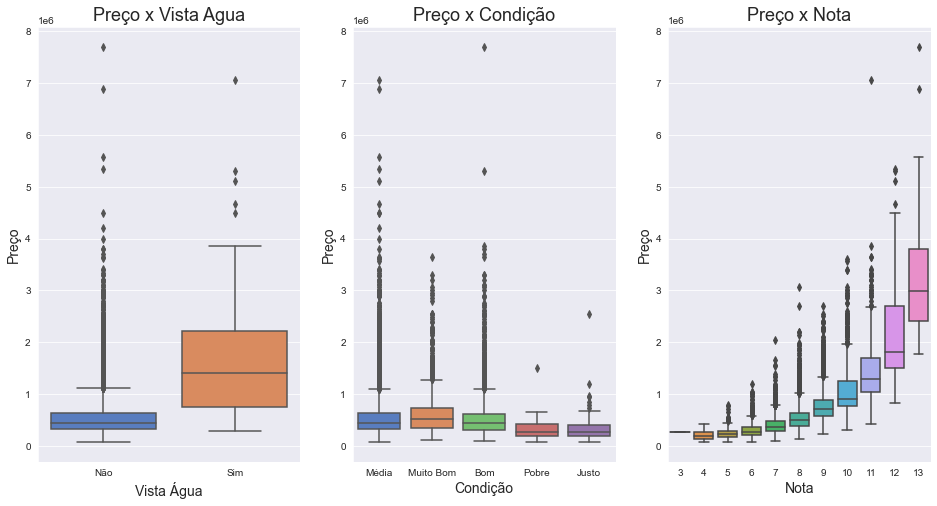

In [23]:
# Restrigindo conjunto de dados, desconsiderando quartos e banheiros nulos
aux1 = df1[(df1['quartos'] != 0) & (df1['banheiros'] != 0)]

fig, gr = plt.subplots()

# Tamanho da Figura
gr.figure.set_size_inches(16,8)

# Plotando boxplots 
plt.subplot(1,3,1)
gr = sns.boxplot( x = 'vista_agua', y = 'preco', data=aux1)
set_plots_features(gr, 'Preço x Vista Agua', 'Vista Água', 'Preço' )

plt.subplot(1,3,2)
gr = sns.boxplot( x = 'condicao', y = 'preco', data=aux1)
set_plots_features(gr, 'Preço x Condição', 'Condição', 'Preço' )

plt.subplot(1,3,3)
gr = sns.boxplot( x = 'nota', y = 'preco', data=aux1)
set_plots_features(gr, 'Preço x Nota', 'Nota', 'Preço')

plt.show()

Pelos gráficos boxplots das variavéis categóricas podemos observar que:


* Casas com vista para a água tem uma mediana maior do que casas sem vista para água. E também o primeiro quartil de casas com vista para água são mais valorizadas do que o terceiro quartil de casas sem vista para água, mas pode-se ver que existem muitos outliers nas casas que não tem vista para a água.


* As condições de casas média, bom e muito bom se destacam mais, visto que, existe pouca diferença entre suas medianas. Casas de condições médias possuem uma mediana equivalente com casas de condições boas. Nota-se também a presença significativa de outliers.


* Conforme aumenta a nota das casas sobre o preço, mais as casas são valorizadas, pois há um crescimento exponencial no gráfico.

**Obs: análise conjunta do condado**

## 1.7 Localização dos Imóveis 

Nessa etapa, vou localizar no mapa onde estão as casas do conjunto de dados.

In [24]:
fig = px.scatter_mapbox(df1, lat="lat", lon="long", color='preco', size='preco',
                        color_continuous_scale=px.colors.sequential.RdBu, zoom=7, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

Podemos verificar que existe uma concentração maior dos imóveis na região Norte/Seattle. Também há casas que estão concentradas no sul. E por último, poucas casas se encontram mais afastadas dos centros urbanos, imóveis que ficam na Região das Montanhas. Portanto para uma análise exploratória mais elaborada dos dados, vou dividir as observações por regiões, sendo: regiões Norte/Seattle, região Sul e região das Montanhas.

# 2.0 Feature Engineering

## 2.1 Criação Mapa Mental de Hipóteses

Com algumas diretrizes definidas de como farei a análise exploratória de dados, vou começar a criar algumas hipóteses utilizando um **Mapa Mental de Hipóteses**. Esse passo é de extrema importância, pois ajudará a organizar as ideias de uma forma mais simples e eficiente do que estou querendo elaborar.

Portanto, na imagem abaixo, coloco características, requisitos dos quais julgo ser importante no momento que avalio a compra ou a venda de um imóvel.

![mapa](image/Vendas_de_Casas.png)

Observando a imagem acima, coloquei como filtro central a **venda de casas**, em razão de que estou buscando para responder as perguntas que CEO propôs. Logo, julgo necessário avaliar dois requisitos para a venda de um imóvel. No caso: características sobre a casa e a localização.


Elaborando o raciocínio desta forma, procurei colocar informações coerentes em cada requisito do que é avaliado no mercado imobiliário.


Portanto, a partir desse **Mapa Mental**, vou criar as respectivas hipóteses.

## 2.2 Criação de Hipóteses

Baseando-se no **Mapa Mental de Hipóteses**, fiz as seguintes hipóteses para validação:

**1.** Casas antigas devem ser menos valorizadas


**2.** Casas com maior área devem ser mais valorizadas


**3.** Casas com mais números de quartos devem ser mais valorizadas.


**4.** Casas com mais números de banheiros devem ser mais valorizadas.


**5.** Casas reformadas devem ser mais valorizadas.


**6.** Casas com porão devem ser mais valorizadas.


**7.** Casas com mais condições devem ser mais valorizadas.


**8.** Casas com maiores notas devem ser mais valorizadas.


**9.** Casas com vista para água devem ser mais valorizadas.


**10.** O verão deve ser a estação que mais vende casas.


**11.** Casas na região Norte/Seattle devem ser mais valorizadas do que casas na região das Montanhas e Sul.

## 2.3 Featuring Engineering

Com a criação das hipóteses já realizada, nesse passo irei fazer o processo de **Feature Engineering**, ou seja, vou criar novas variáveis com base no que já foi analisado na *estatística descritiva* e na *criação das respectivas hipóteses*. Mas antes, como o módulo 1 foi finalizado, vou salvar uma cópia do conjunto de dados para não perder o que já foi feito.

In [25]:
# Salvando cópia do conjunto de dados
df2 = df1.copy()

Como uma das perguntas é responder o melhor momento de compra de imóveis, vou criar duas features baseadas no ano e mês de venda que ocorreram as casas.

In [26]:
# Ano da Venda
df2['ano_venda'] = df2['data'].dt.year

# Mês da Venda
df2['mes_venda'] = df2['data'].dt.month

As próximas features a serem elaboradas referem as casas que foram reformadas e possuem porão. Por mais que o conjunto de dados me conceda essas informações, decidi criar variáveis categóricas.

In [27]:
# Reforma Casa
df2['reforma_casa'] = df2['ano_reforma'].apply(lambda x: 'Sim' if x > 0 else 'Não')

# Casa_com_porão
df2['casa_com_porao'] = df2['area_porao'].apply(lambda x: 'Sim' if x > 0 else 'Não')

E como foi decidido anteriormente fazer a análise exploratória de dados por região, criarei a feature "regiao" para obter a quantidade de casas que pertencem a cada setor.

In [28]:
df2['regiao'] = df2.apply(lambda x: 'Norte/Seattle' if (x['lat'] > 47.5) & (x['long'] < -121.805)
                         else 'Sul' if (x['lat'] < 47.5) & (x['long'] < -121.805) else 'Montanhas', axis=1)

Por fim, podemos conferir no gráfico de dispersão, onde cada casa pertence a uma determinada região conforme as coordenadas de latitude e longitude.

In [29]:
fig, gr = plt.subplots()
gr.figure.set_size_inches(16,20)
gr = sns.scatterplot(x='long', y='lat', hue= 'regiao', data = df2)
set_plots_features(gr, 'Regiões do Condado King', 'Longitude', 'Latitude')
plt.show()

ValueError: zero-size array to reduction operation minimum which has no identity

<Figure size 1152x1440 with 1 Axes>

# 3.0 Filtrando Variáveis

Nesse módulo, irei fazer o filtro de variáveis, ou seja, analisarei o dataset para identificar se é possível restringir algum dado que não seja relevante para análise exploratória de dados realizando os seguintes passos:


* Filtrando Linhas


* Selecionando Colunas


No entanto, como procedimento já estabelecido, vamos salvar uma cópia do conjunto de dados antes de começar com as atividades.

In [30]:
# Salvando cópia do conjunto de dados
df3 = df2.copy()

## 3.1 Filtrando Linhas

Vou começar filtrando as linhas. E a primeira análise são as casas que possuem número nulo de banheiros ou quartos, como foi relatado no módulo 1, no tópico de estatística descritiva.

In [31]:
# Analisando casas com banheiros e quartos nulos
df3[(df3['quartos']==0)]

,id,data,preco,quartos,banheiros,area_interna,area_lote,niveis,vista_agua,visualizacao,condicao,nota,area_acima,area_porao,ano_construcao,ano_reforma,codigo,lat,long,area_interna15,area_lote15,ano_venda,mes_venda,reforma_casa,casa_com_porao,regiao
875,6306400140,2014-06-12,1095000.0,0,0,3064,4764,3.5,Não,2,Média,7,3064,0,1990,0,98102,47.6362,-122.322,2360,4000,2014,6,Não,Não,Norte/Seattle
3119,3918400017,2015-02-05,380000.0,0,0,1470,979,3.0,Não,2,Média,8,1470,0,2006,0,98133,47.7145,-122.356,1470,1399,2015,2,Não,Não,Norte/Seattle
3467,1453602309,2014-08-05,288000.0,0,2,1430,1650,3.0,Não,0,Média,7,1430,0,1999,0,98125,47.7222,-122.290,1430,1650,2014,8,Não,Não,Norte/Seattle
4868,6896300380,2014-10-02,228000.0,0,1,390,5900,1.0,Não,0,Justo,4,390,0,1953,0,98118,47.5260,-122.261,2170,6000,2014,10,Não,Não,Norte/Seattle
6994,2954400190,2014-06-24,1295650.0,0,0,4810,28008,2.0,Não,0,Média,12,4810,0,1990,0,98053,47.6642,-122.069,4740,35061,2014,6,Não,Não,Norte/Seattle
8477,2569500210,2014-11-17,339950.0,0,3,2290,8319,2.0,Não,0,Média,8,2290,0,1985,0,98042,47.3473,-122.151,2500,8751,2014,11,Não,Não,Sul
8484,2310060040,2014-09-25,240000.0,0,3,1810,5669,2.0,Não,0,Média,7,1810,0,2003,0,98038,47.3493,-122.053,1810,5685,2014,9,Não,Não,Sul
9773,3374500520,2015-04-29,355000.0,0,0,2460,8049,2.0,Não,0,Média,8,2460,0,1990,0,98031,47.4095,-122.168,2520,8050,2015,4,Não,Não,Sul
9854,7849202190,2014-12-23,235000.0,0,0,1470,4800,2.0,Não,0,Média,7,1470,0,1996,0,98065,47.5265,-121.828,1060,7200,2014,12,Não,Não,Norte/Seattle
12653,7849202299,2015-02-18,320000.0,0,3,1490,7111,2.0,Não,0,Média,7,1490,0,1999,0,98065,47.5261,-121.826,1500,4675,2015,2,Não,Não,Norte/Seattle


Podemos verificar que existem algumas casas com banheiros e quartos **nulos**. Por exemplo, uma casa que custa 1.095.000 dólares não possui banheiro e nem quarto e ter 4 andares não é algo convencional. Acredito que esse dado está errado, assim como em outros que tem 0 quartos e 3 banheiros. Portanto, como solução para esses dados, irei removê-los do conjunto de dados para não contabilizá-los na AED, já que não influenciarão significamente nos resultados.

In [32]:
# Excluindo casas que tem 0 quartos e 0 banheiros
df3 = df3[(df3['quartos'] != 0) & (df3['banheiros'] != 0)]

In [33]:
# Verificando se as casas com banheiros e quartos nulos foram removidos
df3['banheiros'].unique() , df3['quartos'].unique()

(array([1, 3, 2, 5, 4, 6, 7, 8], dtype=int64),
 array([ 3,  2,  4,  5,  1,  6,  7,  8,  9, 11, 10, 33], dtype=int64))

Outro dado importante que irei analisar é sobre a casa que possui 33 quartos, pois pode ser que não esteja de acordo com as outras características.

In [34]:
# Verificando casa com 33 quartos
df3[df3['quartos']==33]

,id,data,preco,quartos,banheiros,area_interna,area_lote,niveis,vista_agua,visualizacao,condicao,nota,area_acima,area_porao,ano_construcao,ano_reforma,codigo,lat,long,area_interna15,area_lote15,ano_venda,mes_venda,reforma_casa,casa_com_porao,regiao
15870,2402100895,2014-06-25,640000.0,33,2,1620,6000,1.0,Não,0,Muito Bom,7,1040,580,1947,0,98103,47.6878,-122.331,1330,4700,2014,6,Não,Sim,Norte/Seattle


Podemos observar que essa casa de 33 quartos e 2 banheiros custa 640.000 dólares e possui uma área interna de 1620 m². Acredito que pelo seu preço, quantidade de banheiros e área interna, o número de quartos dessa casa está errado, pois uma casa considerada padrão não teria essas características. Logo, essa casa deve ter tido um erro no dado. Portanto, irei considerar que essa casa tenha 3 quartos, dado que, é mais viável.

In [35]:
# Trocando valor errado do numeros de quartos para o numero certo ( de 33 para 3)
df3['quartos'] = df3['quartos'].apply(lambda x: 3 if x==33 else x)

In [36]:
# Verificando o número real de quartos
df3['quartos'].unique()

array([ 3,  2,  4,  5,  1,  6,  7,  8,  9, 11, 10], dtype=int64)

## 3.2 Selecionando Colunas

Já para selecionar as colunas, irei análisar as colunas do conjunto de dados.

In [37]:
df3.head().T

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
data,2014-10-13 00:00:00,2014-12-09 00:00:00,2015-02-25 00:00:00,2014-12-09 00:00:00,2015-02-18 00:00:00
preco,221900,538000,180000,604000,510000
quartos,3,3,2,4,3
banheiros,1,3,1,3,2
area_interna,1180,2570,770,1960,1680
area_lote,5650,7242,10000,5000,8080
niveis,1,2,1,1,1
vista_agua,Não,Não,Não,Não,Não
visualizacao,0,0,0,0,0


Observando o conjunto de dados, não irei utilizar as colunas "visualizacao", "area_porao", "ano_reforma", "codigo", "area_interna15" e 'area_lote15' pois não entrarão nas respectivas análises, já que para as features "area_porao" e "ano_reforma" foram criadas features derivadas. E como o que interessa é saber quais casas que são interessantes comprar, esses atributos não são importantes para a análise.

In [38]:
# Lista de colunas que não serão usadas
coluna = ['visualizacao', 'area_porao', 'ano_reforma', 'codigo', 'area_interna15', 'area_lote15']

In [39]:
# Excluindo lista de colunas
df3 = df3.drop(coluna, axis=1)

In [40]:
# Visualizando conjunto de dados
df3.head().T

,0,1,2,3,4
id,7129300520,6414100192,5631500400,2487200875,1954400510
data,2014-10-13 00:00:00,2014-12-09 00:00:00,2015-02-25 00:00:00,2014-12-09 00:00:00,2015-02-18 00:00:00
preco,221900,538000,180000,604000,510000
quartos,3,3,2,4,3
banheiros,1,3,1,3,2
area_interna,1180,2570,770,1960,1680
area_lote,5650,7242,10000,5000,8080
niveis,1,2,1,1,1
vista_agua,Não,Não,Não,Não,Não
condicao,Média,Média,Média,Muito Bom,Média


# 4.0 Análise Exploratória de Dados

Esta etapa é o processo mais importante de todo o projeto. É nela que serão feitas as validações ou não das hipóteses para encaminhar objetivo do projeto. Para isso, vou dividir as análises em três partes: 

* Análise Univariada


* Análise Bivariada


* Analise Multivariada


Porém, antes vou salvar uma cópia do que já foi feito.

In [41]:
# Salvando a cópia do conjunto de dados
df4 = df3.copy()

## 4.1 Análise Univariada

Na Análise Univariada, vou analisar a **variável alvo, as variáveis numéricas e as variáveis categóricas**. Lembrando que, a variável alvo é o **preço** que as casas foram vendidas.

### 4.1.1 Variável Alvo

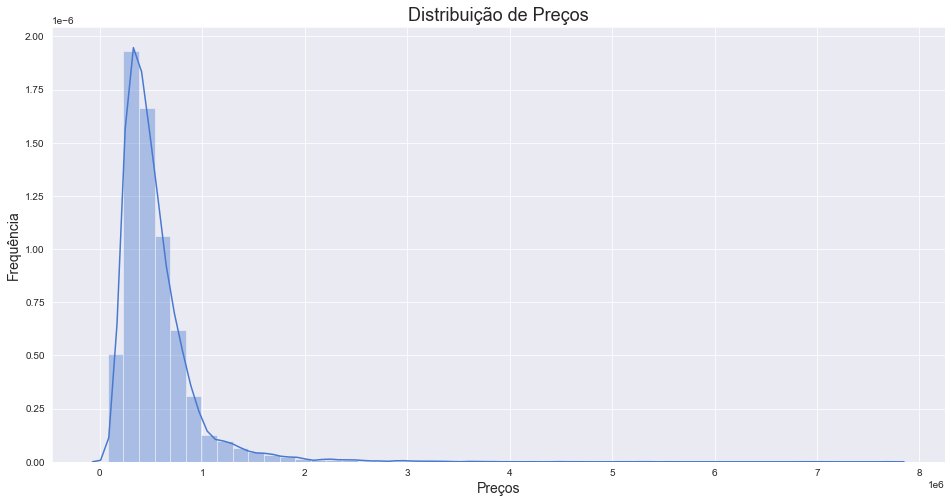

In [42]:
# Plotando a distribuição dos preços
fig, gr = plt.subplots()

# Tamanho da Figura
gr.figure.set_size_inches(16,8)

# Plotando gráfico de distribuição
gr = sns.distplot(df4['preco'])
set_plots_features(gr, 'Distribuição de Preços', 'Preços', 'Frequência')

# Exibindo gráfico
plt.show()

Podemos observar pela distribuição que os preços não se aproximam de uma distribuição normal, pois temos uma distribuição de Poisson, em que é uma distribuição assimétrica positiva. Isso acontece porque a média de preços é maior que mediana e sua moda.

Existem técnicas que transformam essa distribuição em uma normal, mas como isso não é o foco do trabalho, não iremos detalhar esses métodos, pois não será aplicado nenhum modelo de Machine Learning.

### 4.1.2 Variáveis Numéricas

Para as variáveis numéricas, irei plotar seus histogramas para análise e tirar algumas conclusões.

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:8: UserWarning:

To output multiple subplots, the figure containing the passed axes is being cleared



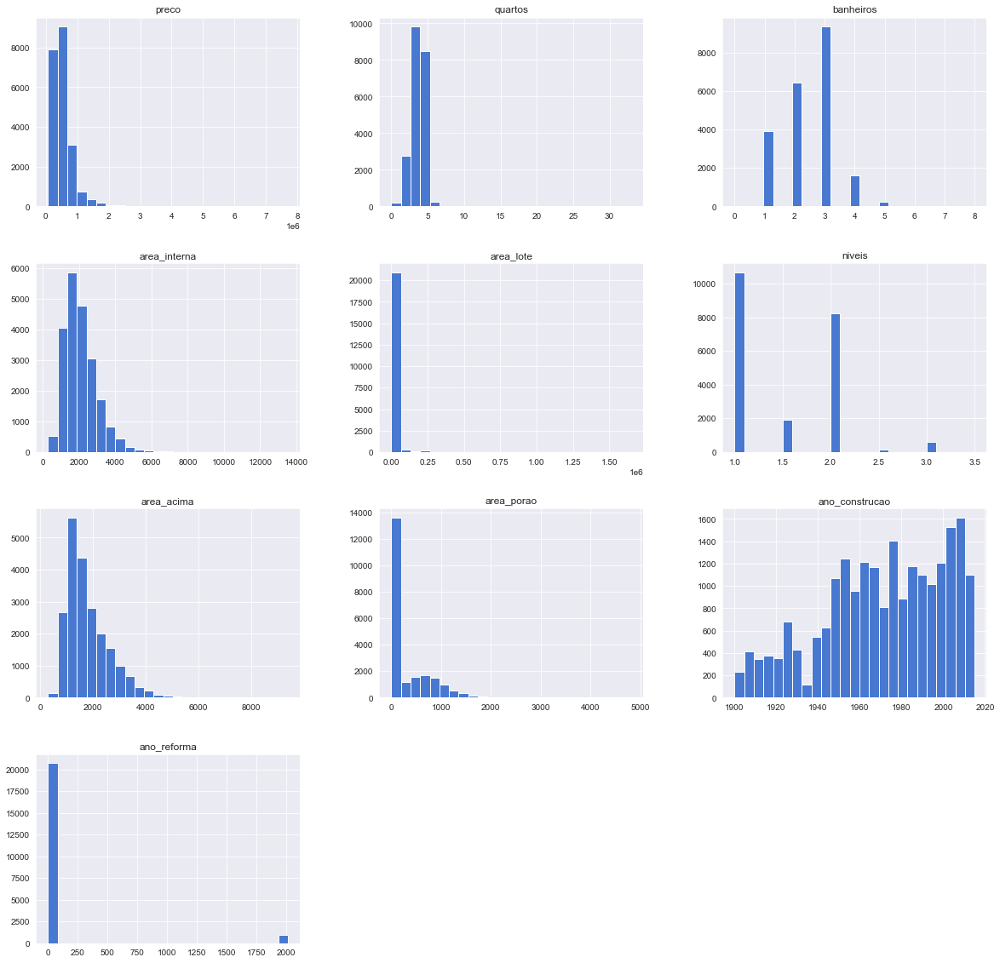

In [43]:
# Tamanho da figura
fig = plt.figure(figsize=(20,20))

# Conjunto de eixos
ax = fig.gca()

# Plotando histogramas
est.hist(ax=ax, bins=25)

# Exibição dos gráficos
plt.show()

Análise dos Histogramas:

- **ano_construcao:** Observa-se que conforme os anos passam, a construção de casas tem um aumento significativo pós-guerra com alguma volatilidade entre as décadas de 1950 a 2000. Porém, a partir dos anos 2000, a construção de casas teve um aumento crescente se estabilizando em 2015.


- **ano_reforma:** observa-se que a maioria das casas não teve reforma. E as casas que foram reformadas ocorreu no final do século 20 e início do século 21.


- **area_casa:** Observa-se que a maioria das casas concentra uma metragem até 2000 m². Essa área não conta se a casa tem porão.


- **area_interna:** Observa-se que a maioria das casas possuem uma área de até 3000 m². No caso essa variável nos da soma da **area_casa** + **area_porao**.


- **area_porao:** Analisa-se que a maioria das casas não possuem porão.


- **area_lote:** Observando o gráfico e os dados, pode-se chegar a conclusão que mais de 20.000 casas possuem uma área entre 5.040 m² e 10.868 m².


- **banheiros:** Pode-se afirmar que a maioria das casas possuem 3 banheiros, seguidos de 2 e 1 banheiros.


- **níveis:** Pode-se observar que as maioria das casas são de 1 e 2 níveis.


- **preço:** Pode-se observar no gráfico que os preços a maioria das casas custam abaixo de 1.000.000 de dólares. Este histograma confirma o que foi visto na estatística descritiva dessa feature.


- **quartos:**  No gráfico, percebe-se que a maioria das casas possuem cerca de 3 a 4 quartos. Isso pode explicar que quanto mais quartos a casa tiver, mais cara ela será.

### 4.1.3 Variáveis Categóricas

In [44]:
# Visualizando variáveis categóricas
cat_atr.head()

,vista_agua,condicao,nota
0,Não,Média,7
1,Não,Média,7
2,Não,Média,6
3,Não,Muito Bom,7
4,Não,Média,8


In [45]:
# Verificando os elementos que a feature condicao possui
df4['condicao'].unique()

array(['Média', 'Muito Bom', 'Bom', 'Pobre', 'Justo'], dtype=object)

In [46]:
# Verificando os elementos que a feature nota possui
df4['nota'].unique()

array([7, 6, 8, 11, 9, 5, 10, 12, 4, 3, 13], dtype=object)

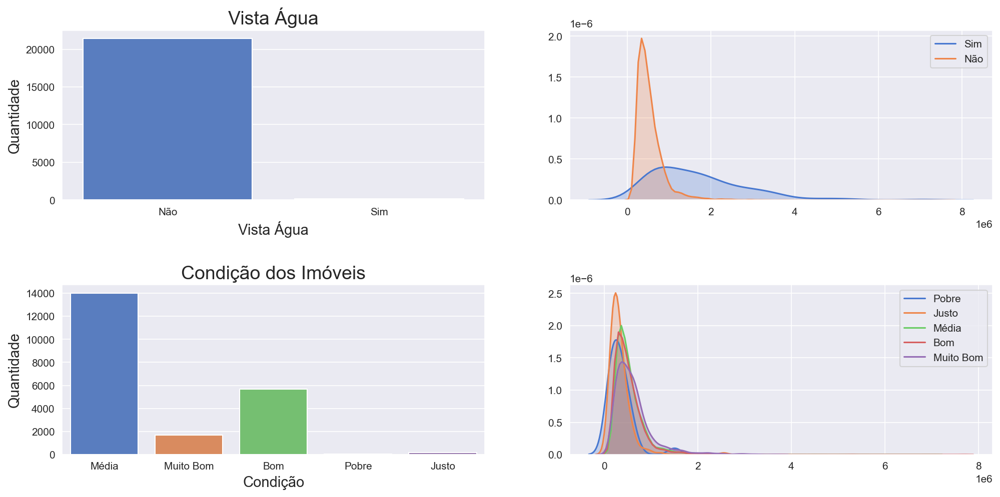

In [47]:
fig, gr = plt.subplots(dpi=150)

gr.figure.set_size_inches(16,12)


# Vista água
plt.subplot(3,2,1)
gr = sns.countplot(df4['vista_agua'])
set_plots_features(gr, 'Vista Água', 'Vista Água', 'Quantidade')

plt.subplot(3,2,2)
gr = sns.kdeplot(df4[df4['vista_agua']== 'Sim']['preco'], label = 'Sim', shade = True)
gr = sns.kdeplot(df4[df4['vista_agua']== 'Não']['preco'], label = 'Não', shade = True)

# Condicao
plt.subplot(3,2,3)
gr = sns.countplot(df4['condicao'])
set_plots_features(gr, 'Condição dos Imóveis', 'Condição', 'Quantidade')

plt.subplot(3,2,4)
gr = sns.kdeplot(df4[df4['condicao'] == 'Pobre']['preco'], label = 'Pobre', shade=True)
gr = sns.kdeplot(df4[df4['condicao'] == 'Justo']['preco'], label = 'Justo', shade=True)
gr = sns.kdeplot(df4[df4['condicao'] == 'Média']['preco'], label = 'Média', shade=True)
gr = sns.kdeplot(df4[df4['condicao'] == 'Bom']['preco'], label = 'Bom', shade=True)
gr = sns.kdeplot(df4[df4['condicao'] == 'Muito Bom']['preco'], label = 'Muito Bom', shade=True)

plt.subplots_adjust(hspace=0.5)

plt.show()

Analisando os gráficos acima concluo que:


* A maioria das casas no condado não tem vista para a água, mas relacionando o preço, casas que tem vista possuem uma distribuição mais uniforme do casas que não tem vista. Isso acontece pelo fato que casas que não tem vista para água têm muitos outliers.


* A maioria das casas apresentam condições média e boa. E nenhuma distribuição se aproxima de uma normal.

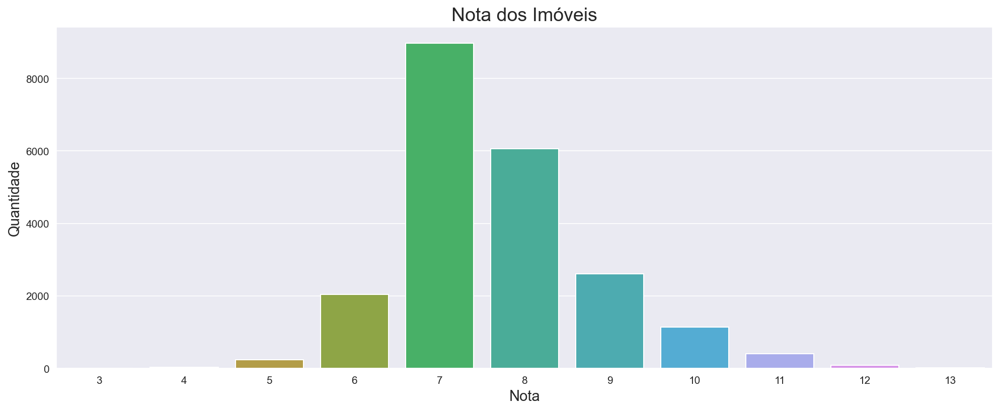

In [48]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da Figura
gr.figure.set_size_inches(16,6)

# Plotando gráfico de barras
gr = sns.countplot(df4['nota'])
set_plots_features(gr, 'Nota dos Imóveis', 'Nota', 'Quantidade')

# Exibição do gráfico
plt.show()

Observando o gráfico acima, percebo que a maioria das casas no Condado King tem nota 7 e 8, ou seja, a maioria das casas tem construção e design médio em bom estado. E também são poucas casas que têm média inferior a 7 comparando com as demais. Portanto, concluo que as casas do condado têm uma boa qualidade de construção e design.

## 4.2 Análise Bivariada

Na análise bivariada, vou fazer a validação das hipóteses que foram criadas por região na seção 2. Antes irei separar os dados por região para fazer as observações por setores.

In [49]:
# Casas Região Norte
norte = df4[df4['regiao']=='Norte/Seattle']

# Casas Região das Montanhas
montanhas = df4[df4['regiao']=='Montanhas']

# Casas Região Sul
sul = df4[df4['regiao'] =='Sul']

### H1. Casas antigas devem ser menos valorizadas.

#### Região Norte/Seattle
*Falso: Casas antigas não são menos valorizadas.*

In [50]:
# Selecionado colunas 
norte_ano = norte[['ano_construcao', 'preco']]

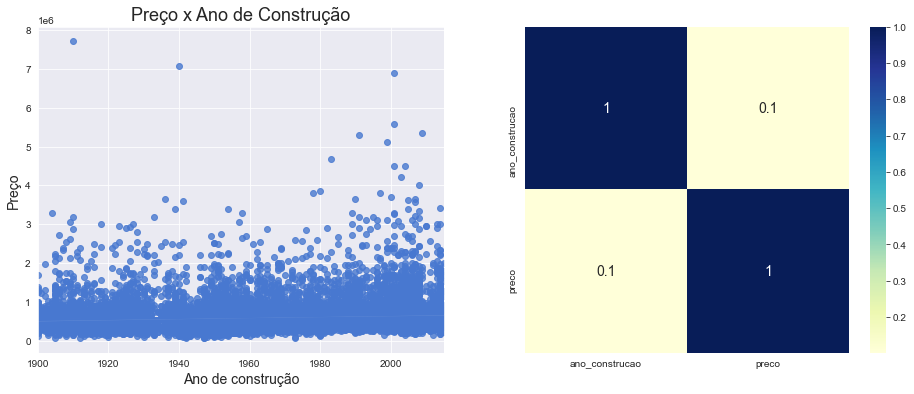

In [51]:
fig, gr = plt.subplots()

# Tamanho da figura
gr.figure.set_size_inches(16,6)

# Plotando uma reta de regressão
plt.subplot(1, 2, 1)
gr = sns.regplot(x='ano_construcao', y = 'preco', data=norte_ano)
set_plots_features(gr,'Preço x Ano de Construção', 'Ano de construção', 'Preço' )

# Plotando mapa de calor
plt.subplot(1, 2, 2)
gr = sns.heatmap(norte_ano.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap="YlGnBu")

# Exibição do gráfico
plt.show()

Na região Norte, observamos pelo gráfico de dispersão que os pontos não possuem uma tendência, tanto que existem casas antigas muito mais caras do que casas que foram construídas recentemente. Isso se confirma pela matriz de correlação cujo coeficiente é de 0.10, sendo que é considerado um valor positivo desprezível,onde existe pouquissima relação entre o ano de construção e o preço das casas.

Portanto, para a Região Norte a hipótese é **FALSA**.

#### Região Montanhas
*Verdadeiro: Casas antigas são menos valorizadas.*

In [52]:
# Selecionando variáveis
montanhas_ano = montanhas[['ano_construcao', 'preco']]

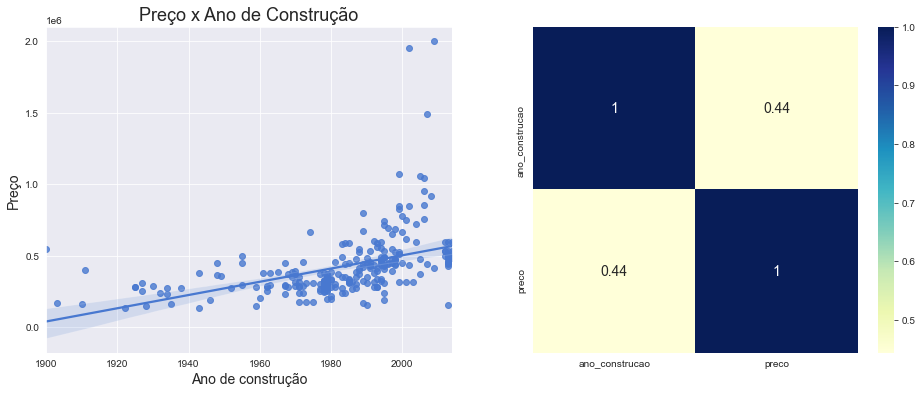

In [53]:
fig, gr = plt.subplots()

# Tamanho da figura
gr.figure.set_size_inches(16,6)

# Plotando uma reta de Regressão
plt.subplot(1, 2, 1)
gr = sns.regplot(x='ano_construcao', y = 'preco', data=montanhas_ano)
set_plots_features(gr,'Preço x Ano de Construção', 'Ano de construção', 'Preço' )

# Plotando mapa de calor
plt.subplot(1, 2, 2)
gr = sns.heatmap(montanhas_ano.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap="YlGnBu")

# Exibição do gráfico
plt.show()

Na região das Montanhas, observamos pelo gráfico de dispersão que os pontos seguem uma tendência crescente com relação a reta de regressão. E na matriz de correlação verifica-se o valor do coeficiente de 0.44, que é um valor positivo moderado, isto é, quanto mais recente é a construção das casas, mais valorizadas são.

Portanto, para a Região da Montanhas a hipótese é **VERDADEIRA**.

#### Região Sul
*Falso: Casas antigas não são menos valorizadas.*

In [54]:
# Selcionando variáveis
sul_ano = sul[['ano_construcao', 'preco']]

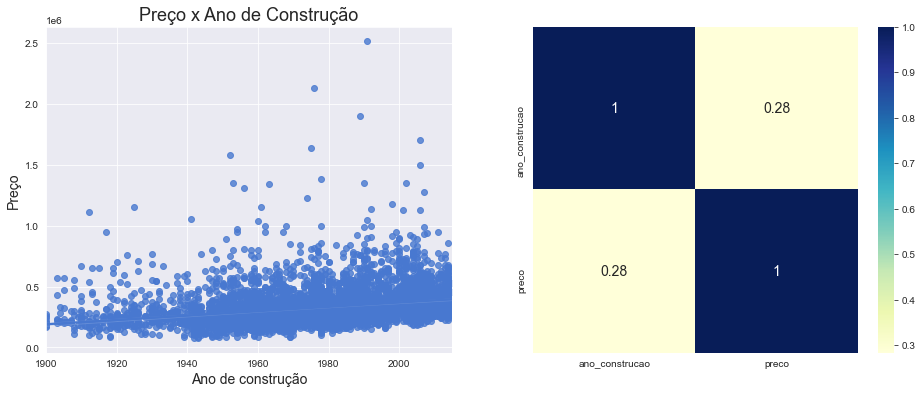

In [55]:
fig, gr = plt.subplots()

# Tamanho da figura
gr.figure.set_size_inches(16,6)

# Plotando uma reta de regressão
plt.subplot(1, 2, 1)
gr = sns.regplot(x='ano_construcao', y = 'preco', data=sul_ano)
set_plots_features(gr,'Preço x Ano de Construção', 'Ano de construção', 'Preço' )

# Plotando mapa de calor
plt.subplot(1, 2, 2)
gr = sns.heatmap(sul_ano.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap="YlGnBu")

# Exibição do gráfico
plt.show()

Na região Sul, observamos pelo gráfico de dispersão que os pontos não possuem tanto uma tendência crescente, tanto que existem casas antigas muito mais caras do que casas que foram construídas recentemente. Isso se confirma pela matriz de correlação cujo coeficiente é de 0.28, sendo que é considerado um valor positivo desprezível, ou seja, existe pouquissima relação entre o ano de construção e o preço das casas.

Portanto, para a região a Região Sul a hipótese é **FALSA**.

### H2. Casas com maior área devem ser mais valorizadas

#### Região Norte/Seattle
*Verdadeira: Casas com maior área são mais valorizadas*

In [56]:
# Selecionando Variáveis
norte_area = norte[['area_interna', 'preco']]

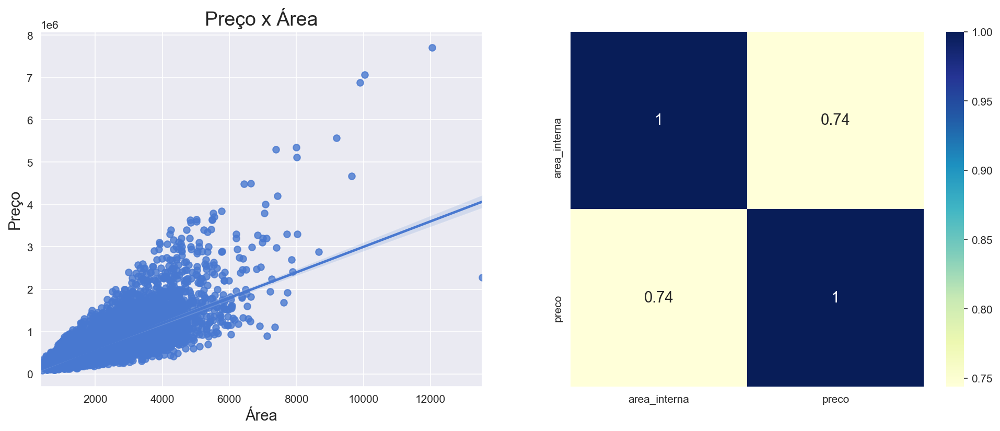

In [57]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,6)

# Plotando uma reta de regressão
plt.subplot(1, 2, 1)
gr = sns.regplot(x='area_interna', y = 'preco', data=norte_area)
set_plots_features(gr, 'Preço x Área', 'Área', 'Preço' )

# Plotando mapa de calor
plt.subplot(1, 2, 2)
gr = sns.heatmap(norte_area.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap = "YlGnBu")

# Exibição do gráfico
plt.show()

Na região Norte, pelos gráficos, observamos uma correlação forte positiva, 0.74, entre o preço e a área das casas. Logo, concluo que quanto maior a área das casas maiores são os preços. Portanto, para a Região da Norte a hipótese é **VERDADEIRA**.

#### Região das Montanhas
*Verdadeira: Casas com maior área são mais valorizadas.*

In [58]:
# Selecionando Variáveis
montanhas_area = montanhas[['area_interna', 'preco']]

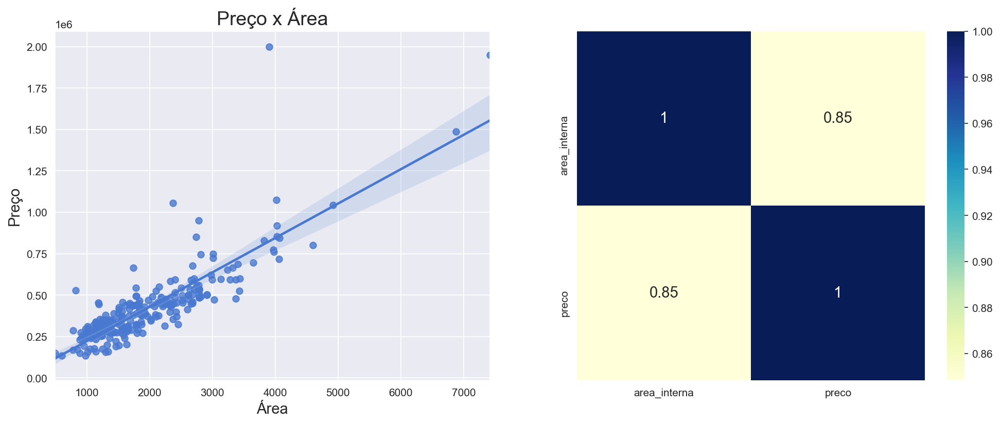

In [59]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,6)

# Plotando uma reta de regressão
plt.subplot(1, 2, 1)
gr = sns.regplot(x='area_interna', y = 'preco', data=montanhas_area)
set_plots_features(gr, 'Preço x Área', 'Área', 'Preço' )

# Plotando mapa de calor
plt.subplot(1, 2, 2)
gr = sns.heatmap(montanhas_area.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap = "YlGnBu")

# Exibição do gráfico
plt.show()

Na região das Montanhas, pelos gráficos, observamos uma correlação forte positiva, 0.85, entre o preço e a área das casas. Logo, concluo que quanto maior a área das casas maiores são os preços. Portanto, para a Região das Montanhas a hipótese é **VERDADEIRA**.

#### Região Sul
*Verdadeira: Casas com maior área são mais valorizadas*

In [60]:
# Selecionando Variáveis
sul_area = sul[['area_interna', 'preco']]

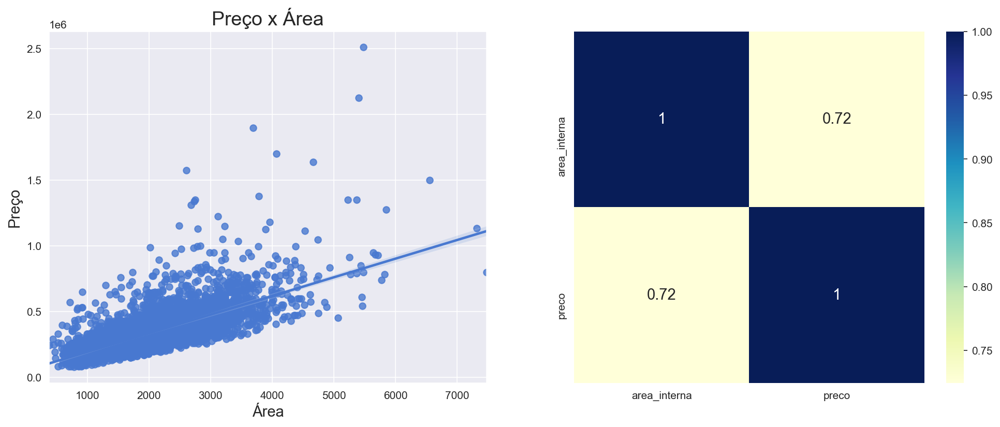

In [61]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,6)

# Plotando uma reta de regressão
plt.subplot(1, 2, 1)
gr = sns.regplot(x='area_interna', y = 'preco', data=sul_area)
set_plots_features(gr, 'Preço x Área', 'Área', 'Preço' )

# Plotando mapa de calor
plt.subplot(1, 2, 2)
gr = sns.heatmap(sul_area.corr(method='pearson'),annot=True, annot_kws={'fontsize':14}, cmap = "YlGnBu")

# Exibição do gráfico
plt.show()

Na região Sul, pelos gráficos, observamos uma correlação forte positiva, 0.72, entre o preço e a área das casas. Logo, concluo, também, que quanto maior a área das casas maiores são os preços. Portanto, para a Região Sul a hipótese é **VERDADEIRA**.

### H3. Casas com mais números de quartos devem ser mais valorizadas.

#### Região Norte/Seattle
*Falsa: Casas com mais números de quartos não são mais valorizadas.*

In [62]:
# Selecionando e agrupando por variáveis
norte_quartos_preço = norte[['quartos', 'preco']].groupby('quartos').mean().reset_index()
norte_quartos_preço

,quartos,preco
0,1,3.409467e+05
1,2,4.379249e+05
2,3,5.502847e+05
3,4,7.552220e+05
4,5,9.047163e+05
5,6,9.371696e+05
6,7,1.009546e+06
7,8,1.233000e+06
8,9,8.939998e+05
9,10,8.193333e+05


In [63]:
# Quantidade de casas por número de quartos
norte['quartos'].value_counts()

3     6407
4     4718
2     2193
5     1220
6      215
1      147
7       33
8       11
9        6
10       3
11       1
Name: quartos, dtype: int64

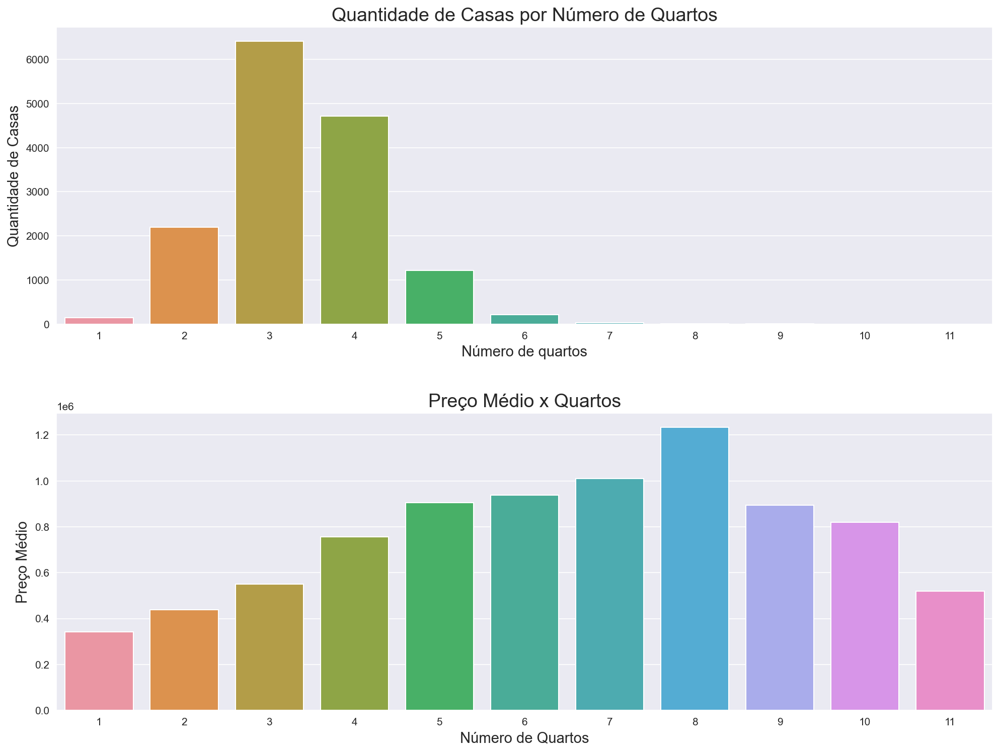

In [64]:
fig, gr = plt.subplots(dpi = 150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(norte['quartos'])

# Titulo e eixos rotulados
set_plots_features(gr, 'Quantidade de Casas por Número de Quartos', 'Número de quartos',
                   'Quantidade de Casas')

# Plotando gráfico de barras
plt.subplot(2,1,2)
gr = sns.barplot(x = 'quartos', y = 'preco', data= norte_quartos_preço)

# Título e eixos rotulados
set_plots_features(gr, 'Preço Médio x Quartos', 'Número de Quartos', 'Preço Médio')
plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

Na Região Norte, verifico pelo primeiro gráfico que há mais casas com 3 e 4 dormitórios. Já no segundo gráfico analisando o preço médio em relação ao número de quartos, posso afirmar que casas com mais quartos são mais baratas do que casas com menos quartos, pois há casas com 9, 10 e 11 quartos que são mais baratos. Isso pode ocorrer pelas más condições que ambas as casas se encontram.

Portanto, a hipótese para a Região Norte/Seattle é **FALSA**.

#### Região das Montanhas
*Verdadeira: Casas com mais números de quartos são mais valorizadas.*

In [65]:
# Selecionando e agrupando variáveis
montanhas_quartos_preço = montanhas[['quartos', 'preco']].groupby('quartos').mean().reset_index()
montanhas_quartos_preço

,quartos,preco
0,1,295137.500000
1,2,354216.346154
2,3,384145.688312
3,4,550197.948276
4,5,625055.250000


In [66]:
# Quantidade de casas por número de quartos
montanhas['quartos'].value_counts()

3    154
4     58
2     26
5      8
1      4
Name: quartos, dtype: int64

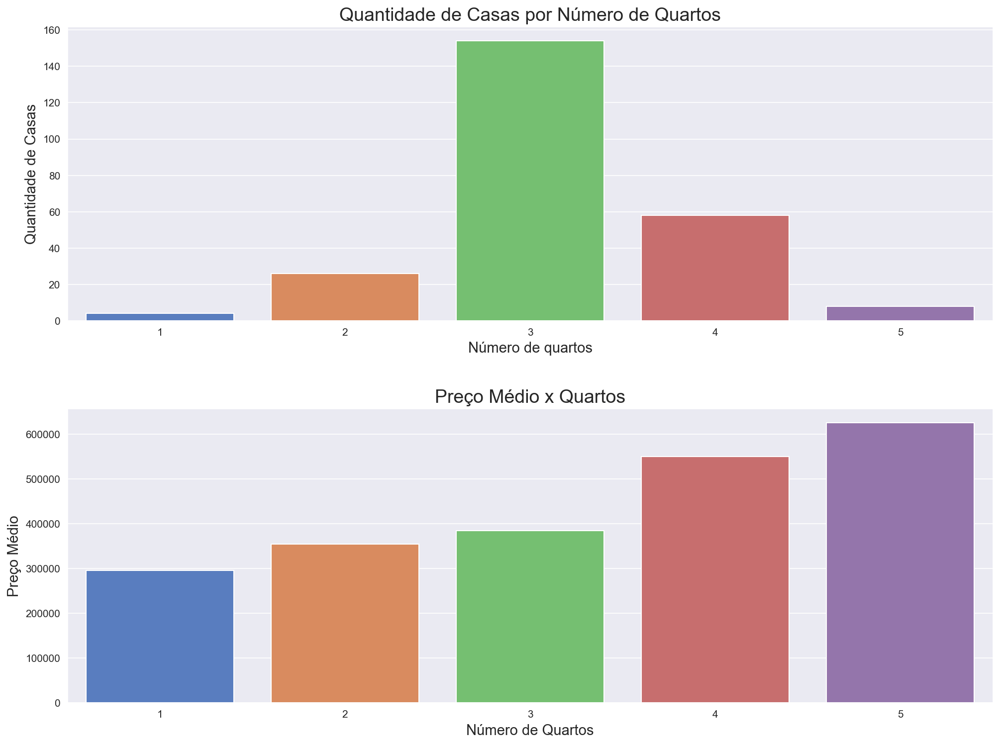

In [67]:
fig, gr = plt.subplots(dpi = 150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(montanhas['quartos'])
# Titulo e rotulos nos eixos
set_plots_features(gr, 'Quantidade de Casas por Número de Quartos', 'Número de quartos',
                   'Quantidade de Casas')

# Plotando gráfico de barras
plt.subplot(2,1,2)
gr = sns.barplot(x = 'quartos', y = 'preco', data = montanhas_quartos_preço)
# Titulo e rotulos nos eixos
set_plots_features(gr, 'Preço Médio x Quartos', 'Número de Quartos', 'Preço Médio')
plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

Na Região das Montanhas, verifico no primeiro gráfico que existem mais casas com 3 e 4 dormitórios. Já no segundo gráfico, concluo que quanto mais números de quartos as casas tem, mais são valorizadas, pois o preço médio vai aumentando.

Nesse caso, a hipótese para a Região das Montanhas é **VERDADEIRA**.

#### Região Sul
*Falsa: Casas com mais números de quartos não são mais valorizadas.*

In [68]:
# Selecionando e agrupando variáveis
sul_quartos_preço = sul[['quartos', 'preco']].groupby('quartos').mean().reset_index()

In [69]:
# Quantidade de casas por número de quartos
sul['quartos'].value_counts()

3    3264
4    2106
2     541
5     373
6      57
1      45
7       5
8       2
Name: quartos, dtype: int64

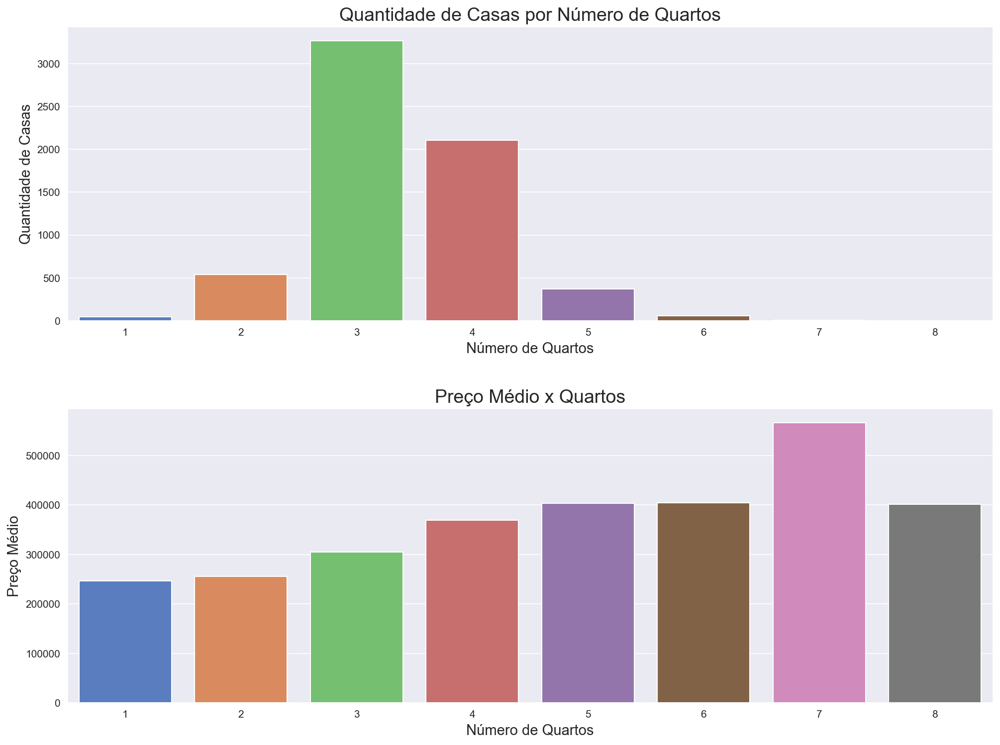

In [70]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(sul['quartos'])
# Titulo e rotulos nos eixos
set_plots_features(gr, 'Quantidade de Casas por Número de Quartos', 'Número de Quartos',
                   'Quantidade de Casas')

# Plotando gráfico de barras
plt.subplot(2,1,2)
gr = sns.barplot(x = 'quartos', y = 'preco', data= sul_quartos_preço)

# Titulo e rotulos nos eixos
set_plots_features(gr, 'Preço Médio x Quartos', 'Número de Quartos', 'Preço Médio')

plt.subplots_adjust(hspace=0.3)

# Exibição do gráfico
plt.show()

Na região Sul, verifico pelo primeiro gráfico que tem mais casas com 3 e 4 quartos. Já no segundo gráfico concluo que o preço médio das casas em relação ao número de quartos não varia crescentemente, ou seja, casas com mais números de quartos possuem quase o mesmo preço médio de casas com menos quartos. E também casas com 7 quartos são mais caras do que casas com 8 quartos.

Portanto, a hipótese para a Região Sul é **FALSA**.

### H4. Casas com mais números de banheiros devem ser mais valorizadas.

#### Região Norte/Seattle
*Verdadeiro: Casas com mais números de banheiros são mais valorizadas.*

In [71]:
# Selecionando e agrupando variáveis
norte_banheiros_preço = norte[['banheiros', 'preco']].groupby('banheiros').mean().reset_index()
norte_banheiros_preço = round(norte_banheiros_preço, 2)
norte_banheiros_preço

,banheiros,preco
0,1,399460.21
1,2,519183.61
2,3,673200.02
3,4,1055568.14
4,5,1623666.09
5,6,2440310.00
6,7,2854978.00
7,8,4328750.00


In [72]:
# Quantidade de casas por número de banheiros
norte['banheiros'].value_counts()

3    6267
2    4334
1    2710
4    1410
5     194
6      30
7       5
8       4
Name: banheiros, dtype: int64

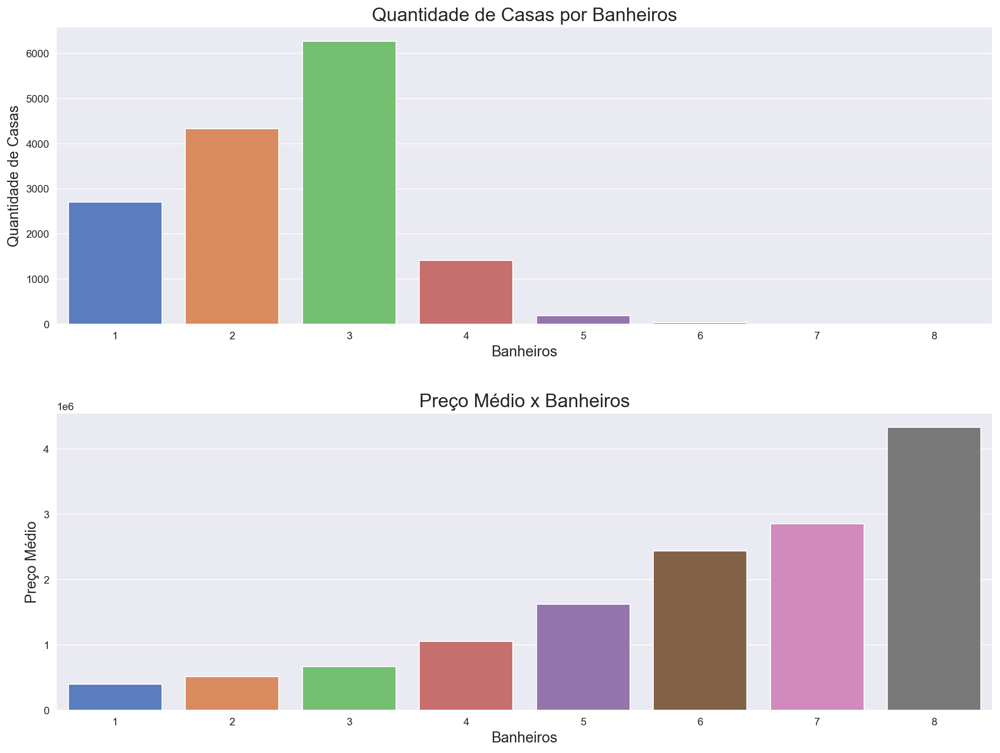

In [73]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(norte['banheiros'])

# Titulo e rotulos nos eixos
set_plots_features(gr, 'Quantidade de Casas por Banheiros', 'Banheiros',
                   'Quantidade de Casas')

# Plotando gráfico de barras
plt.subplot(2,1,2)
gr = sns.barplot(x = 'banheiros', y = 'preco', data= norte_banheiros_preço)

# Titulo e rotulos nos eixos
set_plots_features(gr, 'Preço Médio x Banheiros', 'Banheiros', 'Preço Médio')
plt.subplots_adjust(hspace=0.3)

# Exibição do gráfico
plt.show()

Na Região Norte/Seattle, no primeiro gráfico, verifico que há mais casas com 2 e 3 banheiros. Já no segundo gráfico, concluo pela observação que conforme aumenta o números de banheiros das casas, mais as casas são valorizadas.Portanto, a hipótese valida para a Região Norte/Seattle é **VERDADEIRA**.

#### Região das Montanhas
*Verdadeiro: Casas com mais banheiros são valorizadas.*

In [74]:
# Selecionando e agrupando variáveis
montanhas_banheiros_preço = montanhas[['banheiros', 'preco']].groupby('banheiros').mean().reset_index()
montanhas_banheiros_preço

,banheiros,preco
0,1,2.662951e+05
1,2,3.511593e+05
2,3,5.029348e+05
3,4,8.321942e+05
4,5,1.042000e+06
5,6,1.488000e+06


In [75]:
# Quantidade de casas por número de banheiro
montanhas['banheiros'].value_counts()

3    105
2     87
1     46
4     10
6      1
5      1
Name: banheiros, dtype: int64

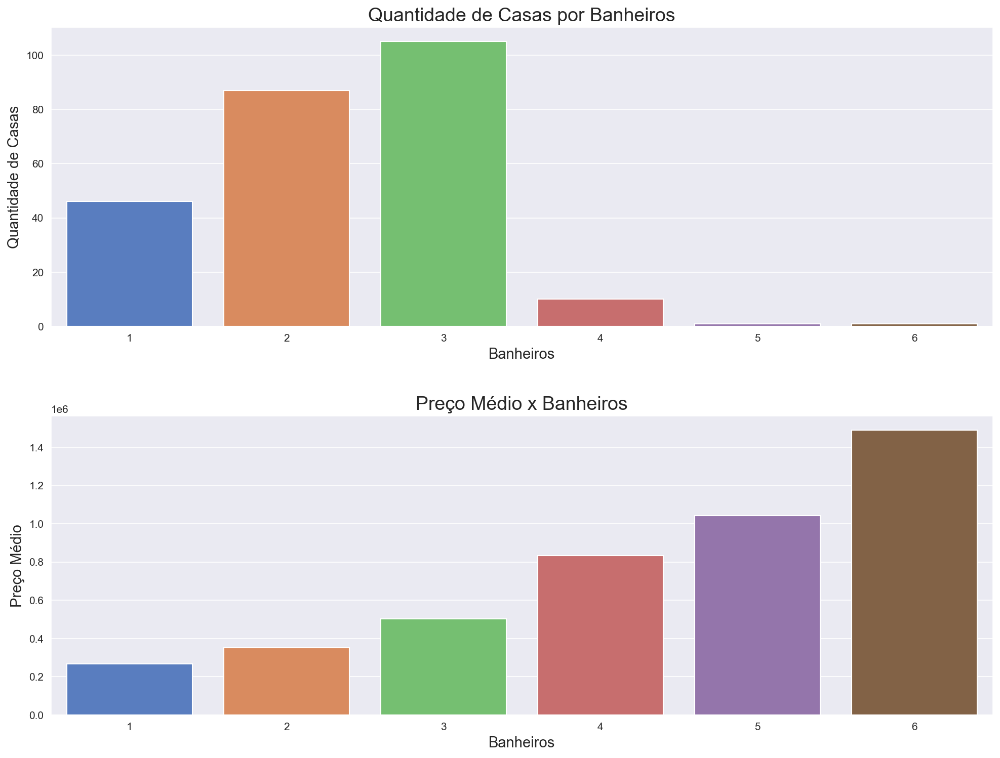

In [76]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(montanhas['banheiros'])
# Titulo e rotulos nos eixos
set_plots_features(gr, 'Quantidade de Casas por Banheiros', 'Banheiros',
                   'Quantidade de Casas')


# Plotando gráfico de barras
plt.subplot(2,1,2)
gr = sns.barplot(x = 'banheiros', y = 'preco', data= montanhas_banheiros_preço)

# Titulo e rotulos nos eixos
set_plots_features(gr, 'Preço Médio x Banheiros', 'Banheiros', 'Preço Médio')

plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

Na Região das Montanhas, pela observação no primeiro gráfico que há mais casas com 3 banheiros. E já no segundo gráfico, concluo que quanto mais banheiros as residências tem, mais valorizadas elas são. Portanto, para a Região das Montanhas a hipótese é **VERDADEIRA**.

#### Região Sul
*Falsa: Casas com mais números de banheiros não são mais valorizadas.*

In [77]:
# Selecionando e agrupando variáveis
sul_banheiros_preço = sul[['banheiros', 'preco']].groupby('banheiros').mean().reset_index()

In [78]:
# Quantidade de casas por número de banheiros
sul['banheiros'].value_counts()

3    2990
2    2011
1    1170
4     191
5      28
6       2
7       1
Name: banheiros, dtype: int64

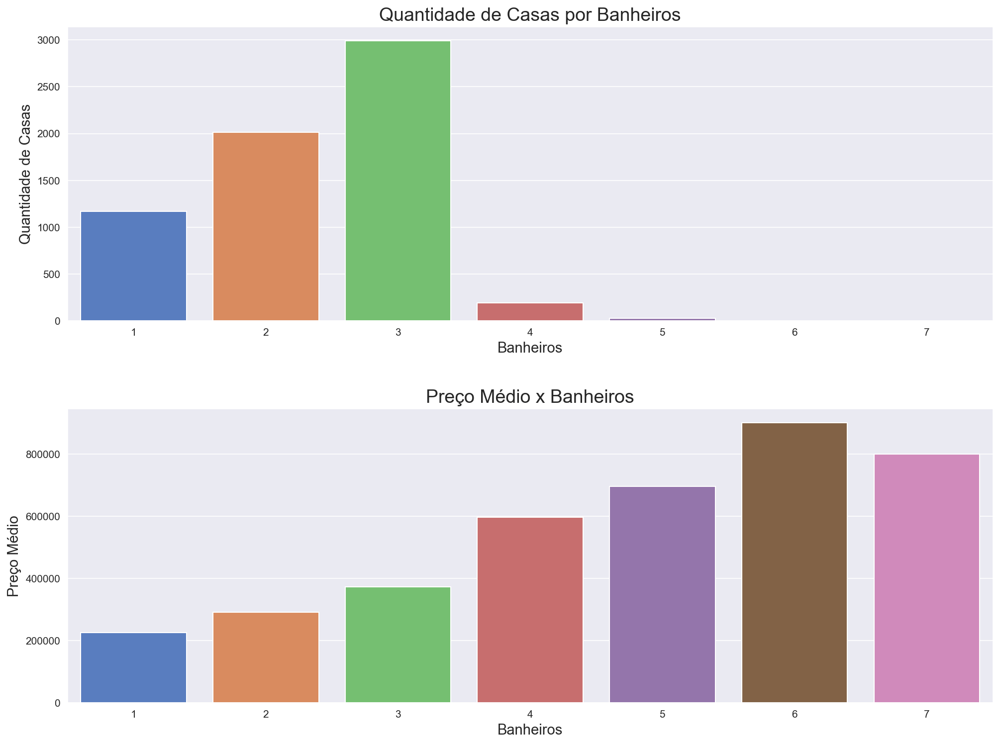

In [79]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(sul['banheiros'])

# Titulo e rotulos nos eixos
set_plots_features(gr, 'Quantidade de Casas por Banheiros', 'Banheiros',
                   'Quantidade de Casas')

# Plotando gráfico de dispersão
plt.subplot(2,1,2)
gr = sns.barplot(x = 'banheiros', y = 'preco', data= sul_banheiros_preço)

# Título e rotulos nos eixos
set_plots_features(gr, 'Preço Médio x Banheiros', 'Banheiros', 'Preço Médio')
plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

Na Região Sul, verifico pelo primeiro gráfico que há mais casas com 2 e 3 banheiros. Já no segundo gráfico concluo pela observação que quanto mais banheiros as residências têm, mas valorizadas são. Entretanto, o preço médio de casas com 6 banheiros são mais valorizadas do que o preço médio de casas com 7 banheiros. Portanto, a hipótese na Região Sul é **FALSA**.

### H5. Casas reformadas devem ser mais valorizadas
*Falso: Casas reformadas não são mais valorizadas.*

In [80]:
# Selecionando e agrupando variáveis
casa_reforma = df4[['reforma_casa','regiao', 'preco']].groupby(['reforma_casa','regiao']).mean().reset_index()
casa_reforma = round(casa_reforma,2)
casa_reforma

,reforma_casa,regiao,preco
0,Não,Montanhas,429851.61
1,Não,Norte/Seattle,620985.78
2,Não,Sul,326453.97
3,Sim,Montanhas,338727.27
4,Sim,Norte/Seattle,865069.69
5,Sim,Sul,396853.57


In [81]:
aux1 = df4[['reforma_casa', 'regiao']]

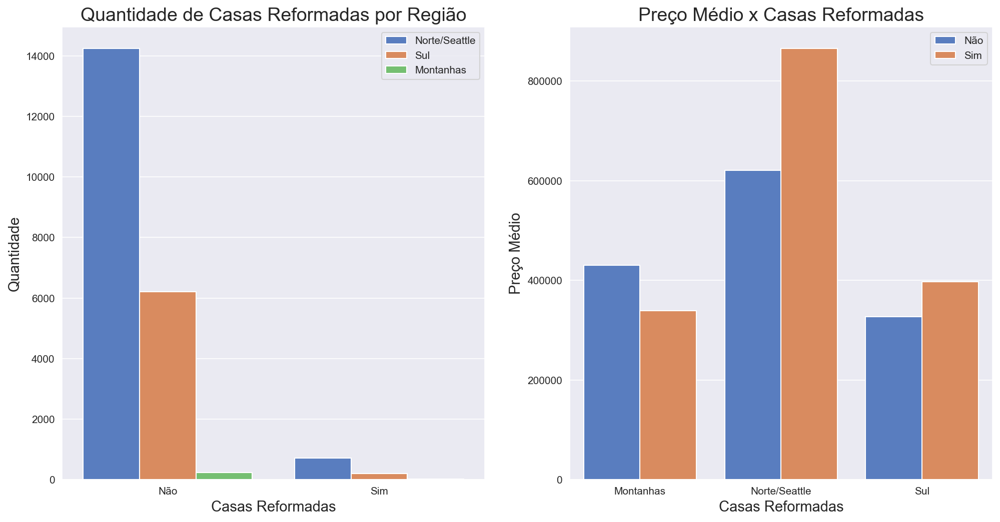

In [82]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,8)

# Plotando gráfico de contagem
plt.subplot(1,2,1)
gr = sns.countplot(x = 'reforma_casa', hue='regiao', data=aux1)
set_plots_features(gr, 'Quantidade de Casas Reformadas por Região', 'Casas Reformadas', 'Quantidade')
plt.legend()

# Plotando gráfico de barras
plt.subplot(1,2,2)
gr = sns.barplot(x = 'regiao', hue= 'reforma_casa', y = 'preco', data = casa_reforma)
set_plots_features(gr,'Preço Médio x Casas Reformadas', 'Casas Reformadas', 'Preço Médio')
plt.legend()

# Exibição do gráfico
plt.show()

Na Região das Montanhas, observo que o preço médio de casas não reformadas é bem mais valorizado do que o preço médio de casas reformadas. E a quantidade de casas não reformadas é maior. Isso deveria ser contraditório, pois geralmente o preço de casas reformadas é mais valorizado. Portanto, a hipótese para a Região das Montanhas é **FALSA**.

Já, na Região Norte, percebo que casas reformadas são mais valorizadas do que casas não reformadas embora a quantidade de casas não reformadas seja maior. Portanto, a hipótese para a Região Norte é **VERDADEIRA**.

E por fim, na Região Sul, verifico que casas reformadas são bem mais valorizadas do que casas não reformadas embora a quantidade de casas não reformadas seja maior. Portanto, a hipótese para a Região Sul é **VERDADEIRA**.

No entanto, a hipótese geral para todo o condado King é **FALSA**.

### H6. Casas com porão devem ser mais valorizadas
*Verdadeiro: Casas com porão são mais valorizadas.*

In [83]:
# Selecionando e agrupando variáveis
casa_porao = df4[['casa_com_porao', 'regiao', 'preco']].groupby(['casa_com_porao', 'regiao']).mean().reset_index()
casa_porao = round(casa_porao, 2)
casa_porao

,casa_com_porao,regiao,preco
0,Não,Montanhas,422035.98
1,Não,Norte/Seattle,582298.17
2,Não,Sul,319737.94
3,Sim,Montanhas,444691.67
4,Sim,Norte/Seattle,694834.18
5,Sim,Sul,351776.73


In [84]:
aux2 = df4[['casa_com_porao', 'regiao']]

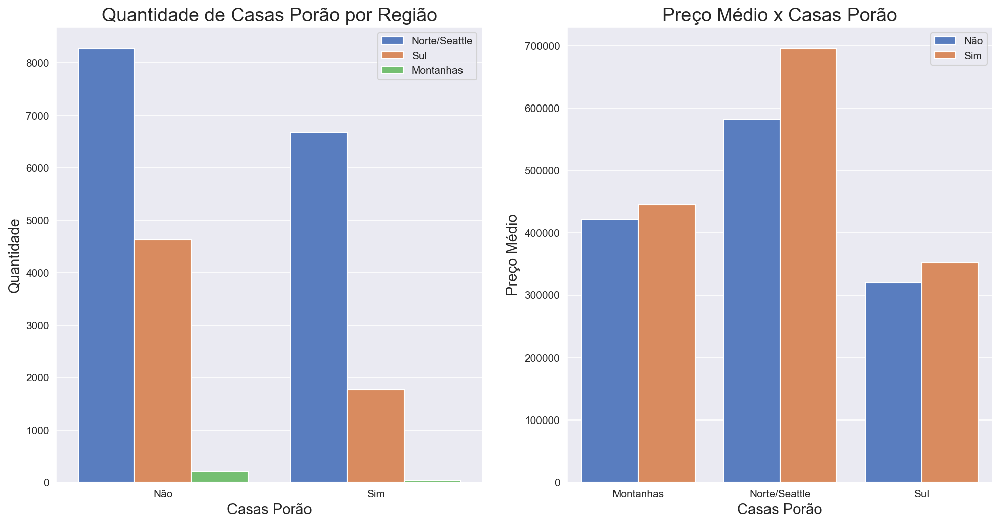

In [85]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,8)

# Plotando gráfico de contagem
plt.subplot(1,2,1)
gr = sns.countplot(x = 'casa_com_porao', hue='regiao', data=aux2)
set_plots_features(gr, 'Quantidade de Casas Porão por Região', 'Casas Porão', 'Quantidade')
plt.legend()

# Plotando gráfico de barras
plt.subplot(1, 2, 2)
gr = sns.barplot(x = 'regiao', hue= 'casa_com_porao', y = 'preco', data = casa_porao)
set_plots_features(gr,'Preço Médio x Casas Porão', 'Casas Porão', 'Preço Médio')
plt.legend()
# Exibição do gráfico
plt.show()

Nas Regiões das Montanhas, Norte/Seattle e Sul percebo que o número de casas com porão é menor do que casas sem porão. Entretanto, os preços médio de casas com porão são mais valorizados. Portanto, a hipótese é **VERDADEIRA**.

### H7. Casas com mais condições devem ser mais valorizadas.

#### Região Norte/Seattle
*Falso: Casas com mais condições não são valorizadas.*

In [86]:
# Selecionando e agrupando variáveis
aux = norte[['condicao', 'preco']].groupby('condicao').mean().reset_index()
aux

,condicao,preco
0,Bom,635980.916120
1,Justo,383963.430000
2,Muito Bom,710000.206089
3,Média,624363.738146
4,Pobre,390293.181818


In [87]:
# Quantidade de casas por condição
norte['condicao'].value_counts()

Média        9891
Bom          3660
Muito Bom    1281
Justo         100
Pobre          22
Name: condicao, dtype: int64

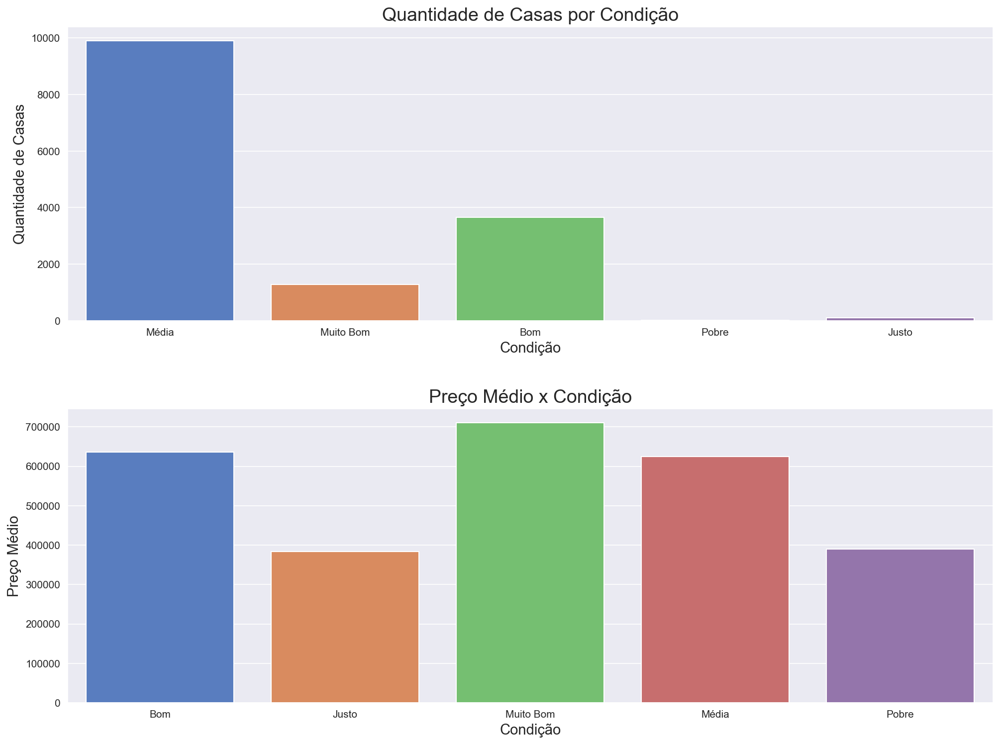

In [88]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(norte['condicao'])

# Titulo e eixos rotulados
set_plots_features(gr, 'Quantidade de Casas por Condição', 'Condição',
                   'Quantidade de Casas')

# Plotando gráfico de barras
plt.subplot(2,1,2)
gr = sns.barplot(x = 'condicao', y = 'preco', data=aux)

# Título e eixos rotulados
set_plots_features(gr, 'Preço Médio x Condição', 'Condição', 'Preço Médio')
plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

Observo pelo primeiro gráfico, que a região Norte/Seattle possui mais casas na condição média, isto é, são  casas consideradas de padrão médio. E pelo segundo gráfico, afirmo que casas de condição superior não são mais valorizadas do que casas de condições inferiores, pois o preço médio entre casas de condições pobre e justo se equiparam. E a mesma situação acontece com casas de condições Média e Bom.

Portanto, a hipótese para a região norte/Seattle é **FALSA**.

#### Região das Montanhas
*Falso: Casas com mais condições não são mais valorizadas.*

In [89]:
# Quantidade de casas por condição
montanhas['condicao'].value_counts()

Média        203
Bom           39
Justo          4
Muito Bom      4
Name: condicao, dtype: int64

In [90]:
# Selecionando e agrupando por variáveis
aux1 = montanhas[['condicao', 'preco']].groupby('condicao').mean().reset_index()
aux1

,condicao,preco
0,Bom,309135.897436
1,Justo,267750.000000
2,Muito Bom,306750.000000
3,Média,453725.290640


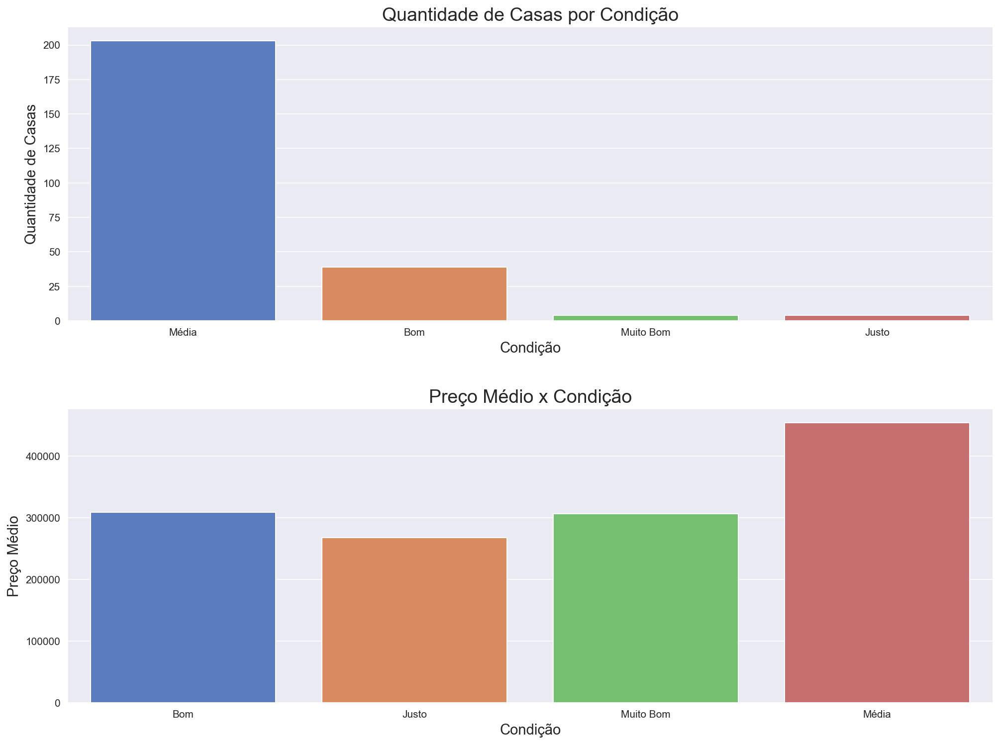

In [91]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(montanhas['condicao'])

# Titulo e eixos rotulados
set_plots_features(gr, 'Quantidade de Casas por Condição', 'Condição',
                   'Quantidade de Casas')

# Plotando gráfico de barras
plt.subplot(2,1,2)
gr = sns.barplot(x = 'condicao', y = 'preco', data=aux1)

# Título e eixos rotulados
set_plots_features(gr, 'Preço Médio x Condição', 'Condição', 'Preço Médio')
plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

Observo pelo primeiro gráfico, que a região das montanhas possui mais casas de condição Média, isto é, são  casas consideradas de padrão médio. E pelo segundo gráfico, concluo que as casas de condição Média são mais valorizadas do que casas de condições Bom e Muito Bom, condições de padrões mais elevados. Portanto, a hipótese para a região das montanhas é **FALSA**.

#### Região Sul
*Falso: Casas com mais condições não são mais valorizadas.*

In [92]:
# Quantidade de casas por condição
sul['condicao'].value_counts()

Média        3926
Bom          1978
Muito Bom     416
Justo          66
Pobre           7
Name: condicao, dtype: int64

In [93]:
# Selecionando e agrupando por variáveis
aux2 = sul[['condicao', 'preco']].groupby('condicao').mean().reset_index()
aux2

,condicao,preco
0,Bom,313208.600607
1,Justo,247243.121212
2,Muito Bom,314869.966346
3,Média,339378.990321
4,Pobre,186357.142857


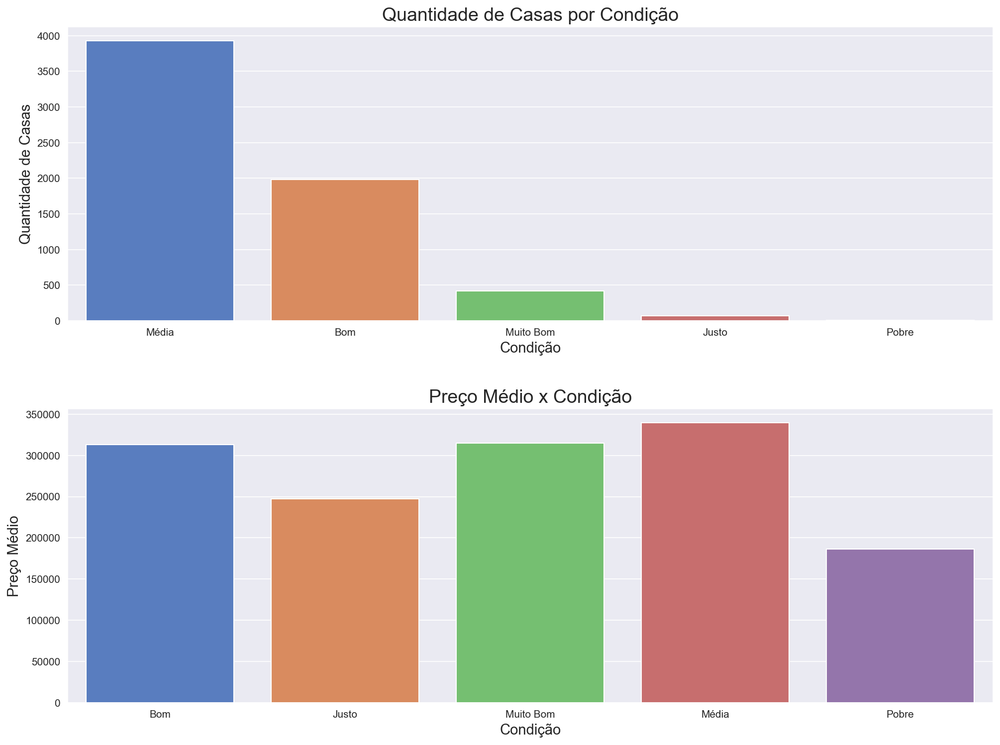

In [94]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(sul['condicao'])

# Titulo e eixos rotulados
set_plots_features(gr, 'Quantidade de Casas por Condição', 'Condição',
                   'Quantidade de Casas')

# Plotando gráfico de barras
plt.subplot(2,1,2)
gr = sns.barplot(x = 'condicao', y = 'preco', data=aux2)

# Título e eixos rotulados
set_plots_features(gr, 'Preço Médio x Condição', 'Condição', 'Preço Médio')
plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

Observo pelo primeiro gráfico, que a região sul possui a maioria das casas de condição Média, isto é, são  casas de padrão médio. E pelo segundo gráfico, concluo que as casas de condição 3 são mais valorizadas do que casas de condições Bom e Muito Bom. Portanto, a hipótese para a região sul é **FALSA**.

### H8. Casas com maiores notas devem ser mais valorizadas.

#### Região Norte/Seattle
*Verdadeiro: Casas com maiores notas são mais valorizadas.*

In [95]:
# Quantidade de Casas por notas
norte['nota'].value_counts()

7     5766
8     4325
9     2050
6     1239
10     985
11     374
5      107
12      82
13      13
4       13
Name: nota, dtype: int64

In [96]:
# Selcionando e agrupando por variáveis
norte_nota = norte[['preco','nota']].groupby('nota').mean().reset_index()

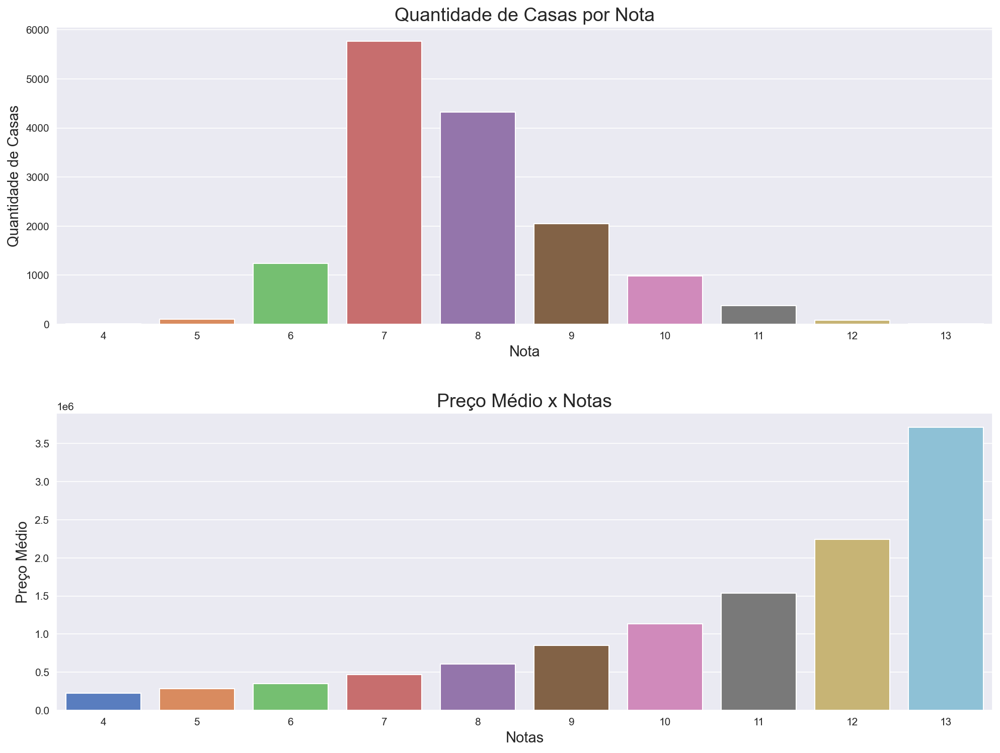

In [97]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(norte['nota'])

# Titulo e eixos rotulados
set_plots_features(gr, 'Quantidade de Casas por Nota', 'Nota',
                   'Quantidade de Casas')

# Plotando gráfico de barras
plt.subplot(2,1,2)
gr = sns.barplot(x = 'nota', y = 'preco', data= norte_nota)

# Título e eixos rotulados
set_plots_features(gr, 'Preço Médio x Notas', 'Notas', 'Preço Médio')
plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

Na região Norte/Seattle,  observo pelo gráfico que a maioria das casas possuem nota 7, ou seja, suas construções são consideradas médias. Já pelo segundo gráfico, concluo que quanto maior a nota das casas mais valorizadas são. Portanto, para a região Norte/Seattle a hipótese é **VERDADEIRA**.

#### Região das Montanhas
*Verdadeiro: Casas com notas são mais valorizadas.*

In [98]:
# Quantidade de Casas por notas
montanhas['nota'].value_counts()

7     114
8      61
9      31
6      19
5      12
10      9
12      3
11      1
Name: nota, dtype: int64

In [99]:
# Selecionando e agrupando por variáveis
montanhas_nota = montanhas[['preco','nota']].groupby('nota').mean().reset_index()

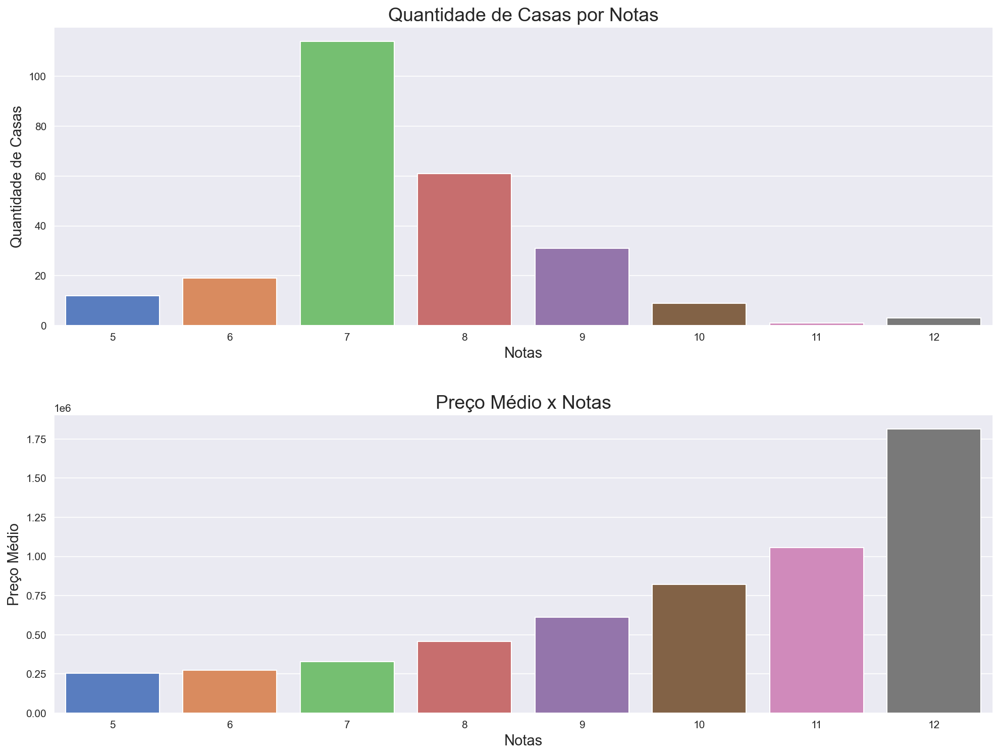

In [100]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(montanhas['nota'])

# Titulo e eixos rotulados
set_plots_features(gr, 'Quantidade de Casas por Notas', 'Notas',
                   'Quantidade de Casas')

# Plotando gráfico de barras
plt.subplot(2,1,2)
gr = sns.barplot(x = 'nota', y = 'preco', data=montanhas_nota)

# Título e eixos rotulados
set_plots_features(gr, 'Preço Médio x Notas', 'Notas', 'Preço Médio')
plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

Na região Norte/Seattle, observo pelo gráfico que a maioria das casas possuem nota 7, 8 e 9 , ou seja, suas construções são consideradas médias para melhores. Já pelo segundo gráfico, afirmo que quanto maior a nota das casas mais valorizadas são.
Portanto, para a região das Montanhas a hipótese é **VERDADEIRA**.

#### Região Sul
*Falsa: Casas com maiores notas não são mais valorizadas.*

In [101]:
# Selecionando e agrupando por variáveis
sul_nota = sul[['preco','nota']].groupby('nota').mean().reset_index()

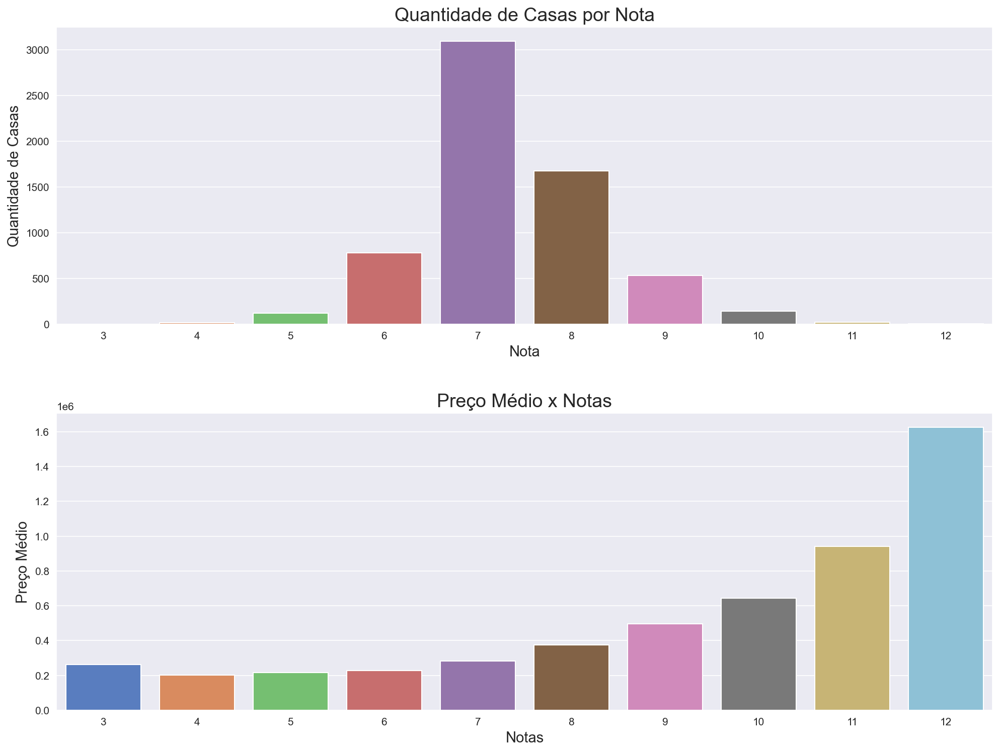

In [102]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,12)

# Plotando gráfico de contagem
plt.subplot(2,1,1)
gr = sns.countplot(sul['nota'])

# Titulo e eixos rotulados
set_plots_features(gr, 'Quantidade de Casas por Nota', 'Nota',
                   'Quantidade de Casas')

# Plotando gráfico de barras
plt.subplot(2,1,2)
gr = sns.barplot(x = 'nota', y = 'preco', data= sul_nota)

# Título e eixos rotulados
set_plots_features(gr, 'Preço Médio x Notas', 'Notas', 'Preço Médio')
plt.subplots_adjust(hspace=0.3)
# Exibição do gráfico
plt.show()

Na região Sul, observo pelo gráfico que a maioria das casas possuem nota 7 e 8, ou seja, suas construções são consideradas médias. Já pelo segundo gráfico, afirmo que há uma equivalência entre os preços médio de casas com notas 4, 5 e 6. E também casas com nota 3 são mais valorizadas. Portanto, para a região Sul a hipótese é **FALSA**.

### H9. O verão deve ser a época que mais vende casas
*Falso: O verão não é a estação que mais vende casas.*

In [103]:
# Mes de venda das casas
casa_venda = df4['mes_venda'].value_counts()

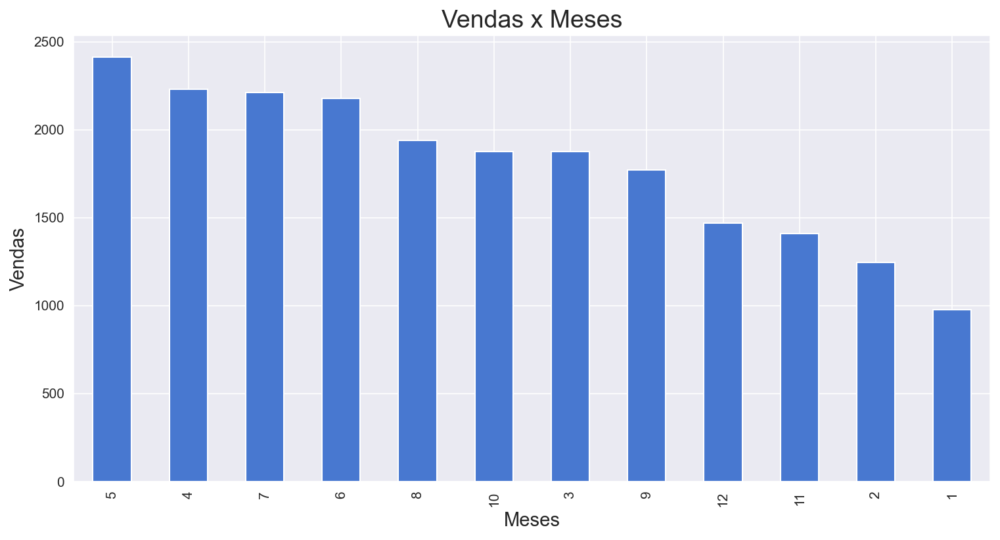

In [104]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(12,6)

# Plotando gráfico
gr = casa_venda.plot(kind = 'bar')

# Titulo e rotulos nos eixos
set_plots_features(gr, 'Vendas x Meses', 'Meses', 'Vendas')

# Exibindo o gráfico
plt.show()

Percebo pelo gráfico que o verão não é estação que mais vende casas. A maioria das vendas acontecem, entre o outono e o verão, nos meses de **Maio, Abril, Julho e Junho**. Portanto, a hipótese de que no verão ocorrem as maiores vendas é **FALSA**.

### H10. Casas da região Norte/Seattle devem ser mais valorizadas do que casas da região Sul e casas da região das Montanhas.
*Verdadeiro: Casas da região Norte/Seattle são mais valorizadas do que casas da região sul e região das montanhas.*

In [105]:
# Selecionando e agrupando por variáveis
montanhas_norte_sul = df4[['regiao', 'preco']].groupby('regiao').mean().reset_index()
montanhas_norte_sul = round(montanhas_norte_sul, 2)
montanhas_norte_sul

,regiao,preco
0,Montanhas,425842.14
1,Norte/Seattle,632590.94
2,Sul,328568.27


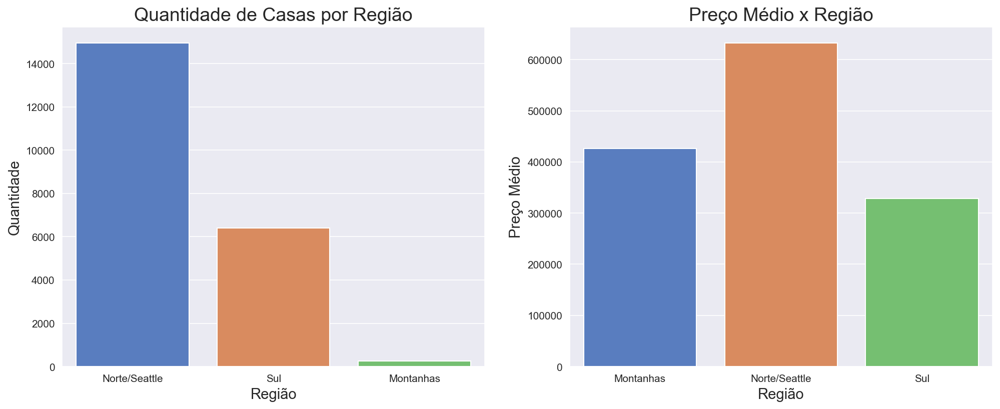

In [106]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,6)

#Plotando Gráfico de Contagem
plt.subplot(1,2,1)
gr = sns.countplot(df4['regiao'])
set_plots_features(gr, 'Quantidade de Casas por Região', 'Região', 'Quantidade')

# Plotando gráfico de barras
plt.subplot(1,2,2)
gr = sns.barplot(x = 'regiao', y = 'preco', data = montanhas_norte_sul)
set_plots_features(gr,'Preço Médio x Região', 'Região', 'Preço Médio')

# Exibição do gráfico
plt.show()

Observando o gráfico, temos a comparação dos preços médios das três regiões. Assim, concluo que a região que casas da Região Norte/Seattle são mais valorizadas do que casas da região das Montanhas e casas da região Sul. E também dizer que casas da região das montanhas são mais valorizadas do casas da região Sul. Considero também que a Região Norte/Seattle possui o maior números de casas, seguidos pela Região Sul e Região das Montanhas.

Portanto, a hipótese é **VERDADEIRA**.

### H11. Casas com vista para a água devem ser mais valorizadas
*Verdadeiro: Casas com vista para a água são mais valorizadas.*

In [107]:
# Selecionando e agrupando por variáveis
casa_agua = df4[['vista_agua', 'preco']].groupby(['vista_agua']).mean().reset_index()

In [108]:
# Quantidade de casas por vista para água
df4['vista_agua'].value_counts()

Não    21434
Sim      163
Name: vista_agua, dtype: int64

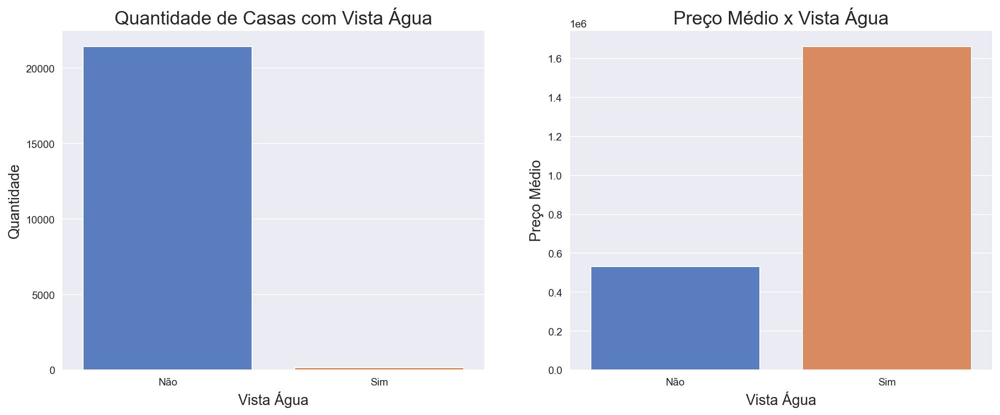

In [109]:
fig, gr = plt.subplots(dpi=150)

# Tamanho da figura
gr.figure.set_size_inches(16,6)

# Plotando gráfico de dispersão
plt.subplot(1,2,1)
gr = sns.countplot(df4['vista_agua'])
set_plots_features(gr,'Quantidade de Casas com Vista Água', 'Vista Água', 'Quantidade')

# Plotando gráfico de barras
plt.subplot(1,2,2)
gr = sns.barplot(x = 'vista_agua', y = 'preco', data = casa_agua)
set_plots_features(gr, 'Preço Médio x Vista Água', 'Vista Água', 'Preço Médio')

# Exibição do gráfico
plt.show()

Mesmo com a quantidade de casas que não tem vista para a água sendo maior do que casas que possuem vista para a água, observo que o preço médio das casas com vista para a água é mais valorizada do que as casas que não tem vista para a água. Portanto, a validade da hipótese é **VERDADEIRA**.

## 4.3 Análise Multivariada

Na análise multivariada, irei medir o grau de relacionamento entre variáveis e os impactos do mesmo. Logo, farei essa análise para as variáveis numéricas e as variáveis categóricas.

### 4.3.1 Variáveis Numéricas

O quadro de correlação abaixo fornece um resumo da correlação entre as variáveis contínuas dos dados. O objetivo por detrás da análise da correlação entre as variáveis contínuas nos dados é identificar as variáveis que têm relação linear significativa com o preço e aqueles que não o fazem. 

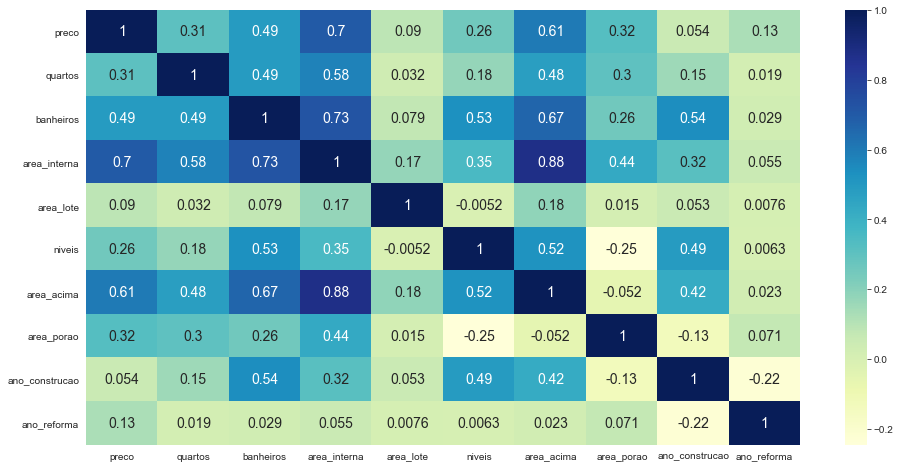

In [110]:
# Correlação entre as variáveis
correlacao = est.corr(method='pearson')

fig, gr = plt.subplots()

# Tamanho da Figura
gr.figure.set_size_inches(16,8)

# Plotando o mapa de calor
sns.heatmap(correlacao, annot=True, annot_kws={'fontsize': 14}, cmap = 'YlGnBu')

# Exibição do gráfico
plt.show()

Da tabela de correlação compreendo que: 

* A variável resposta preço tem uma correlação forte positiva com area_interna e uma correlação positiva moderada com número de banheiros e area_acima.


* A variável resposta Preço tem correlação positiva baixa com número de quartos, níveis, area_porao.


* A variável resposta Preço mostra uma correlação não significativa com area_lote, condicao, ano_construcao.


*  A correlação das variáveis area_acima, banheiros, nota e quartos com area_interna têm uma correlação positiva alta e podem explicar a mesma variação de preço que area_interna.

### 4.3.2 Variáveis Categóricas

Para calcular a correlação entre duas variáveis categóricas, usamos uma medida de associação. E a medida de associação que utilizarei é  <a href='https://en.wikipedia.org/wiki/Cram%C3%A9r%27s_V'>V de Cramer</a>. Sendo assim, vou relembrar as variáveis categóricas.

In [111]:
cat_atr.head()

,vista_agua,condicao,nota
0,Não,Média,7
1,Não,Média,7
2,Não,Média,6
3,Não,Muito Bom,7
4,Não,Média,8


Para utilizar o V de Cramer, usarei uma função que se baseia na literatura que foi disponível.

In [112]:
from scipy import stats as ss
#cramer V
def cramer_v(var_x, var_y):
    # Construção da matriz de confusão
    confusion_matrix = pd.crosstab(var_x, var_y).values
    
    # Soma de todos os valores na matriz
    n = confusion_matrix.sum()
    
    # linhas, colunas
    r, k = confusion_matrix.shape
    
    # Chi-quadrado
    chi2 = ss.chi2_contingency(confusion_matrix)[0]
    
    # Correção de Viés
    chi2corr = max(0, chi2 - (k-1) * (r-1) / (n-1))
    kcorr = k - (k-1) ** 2 / (n-1)
    rcorr = r - (r-1) ** 2 / (n-1)
    
    # Retorna Cramer V
    return np.sqrt((chi2corr/n) / min(kcorr-1, rcorr-1))

In [113]:
# Combinações entre as variáveis categóricas

a1 = cramer_v(cat_atr['vista_agua'], cat_atr['vista_agua'])
a2 = cramer_v(cat_atr['vista_agua'], cat_atr['condicao'])
a3 = cramer_v(cat_atr['vista_agua'], cat_atr['nota'])

a4 = cramer_v(cat_atr['condicao'], cat_atr['vista_agua'])
a5 = cramer_v(cat_atr['condicao'], cat_atr['condicao'])
a6 = cramer_v(cat_atr['condicao'], cat_atr['nota'])

a7 = cramer_v(cat_atr['nota'], cat_atr['vista_agua'])
a8 = cramer_v(cat_atr['nota'], cat_atr['condicao'])
a9 = cramer_v(cat_atr['nota'], cat_atr['nota'])

# Conjunto de Correlações
d = pd.DataFrame({'vista_agua': [a1, a2, a3],
              'condicao': [a4, a5, a6],
              'nota': [a7, a8, a9],
             })

# Indice igual ao das colunas
d = d.set_index(d.columns)

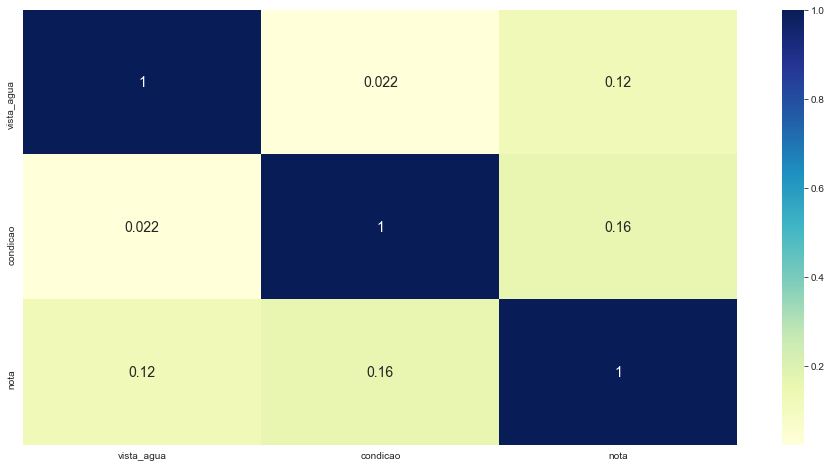

In [114]:
fig, ax = plt.subplots()

# Tamanho da figura
ax.figure.set_size_inches(16, 8)

# plotagem do mapa de calor 
sns.heatmap(d, annot=True, annot_kws={"fontsize":14}, cmap = 'YlGnBu')


# Exibição do gráfico
plt.show()

Da tabela acima compreendo que:

* As correlações entre todas as variáveis envolvidas são independentes, pois são todos coeficientes desprezíveis próximos de zero. 

# 5.0 Respondendo as Perguntas

Nessa etapa, irei comparar os preços das casas por região, levando em consideração as características mais correlacionadas das casas, conforme validação das hipóteses para escolher os imóveis com preços atrativos para investimento. Assim sendo, as variáveis relevantes para essa análise são: **quartos, banheiros, area_interna e nota**. Logo, por meio dessas variáveis já é possível definir respostas e conclusões para responder as perguntas do CEO.

## 5.1. Quais casas o CEO da House Rocket deveria comprar e por qual preço de compra?

Imóveis na região sul são menos valorizadas em comparação aos preços das regiões norte/Seattle e montanhas conforme a **Hipótese H10**. Porém, nessas regiões mais valorizadas existem oportunidades de negócios que são interessantes para investimento.

Dessa maneira, como sugestão, as casas, que o CEO deveria comprar, são aquelas com as mesmas caracteristicas e cujo os preços estão abaixo do preço médio de suas respectivas regiões. Ou seja, casas que têm um preço inferior ao preço da média, com descontos a partir de 20% ( do preço médio ), pois isso garante ganhos significativos em vendas futuras. Essas sugestões de compra estão divididas por regiões realizadas em uma função `norte()`, `montanhas()` e `sul()`.

**OBS**: Foi dada como resposta apenas uma sugestão de valor para a compra de casas, mas o CEO poderá observar os demais imóveis que possuem um percentual menor e tomar suas decisões segundo as tabelas.

### 5.1.1. Região Montanhas

In [115]:
# Quantidade de casas, números de quartos e números de banheiros
montanhas.shape, montanhas['quartos'].unique(), montanhas['banheiros'].unique()

((250, 20),
 array([3, 2, 4, 1, 5], dtype=int64),
 array([3, 1, 2, 4, 5, 6], dtype=int64))

In [116]:
mont(1,1)

Preço Médio: US$ 288183.33


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
2927,8649401270,167000.0,1,1,780,6,Não,42.05
16842,226109056,170000.0,1,1,850,6,Não,41.01


In [117]:
mont(2,1)

Preço Médio: US$ 248671.67


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
13072,1437500035,155000.0,2,1,1010,5,Não,37.67
10169,8570900162,193500.0,2,1,950,7,Não,22.19
9502,3734900110,230000.0,2,1,890,6,Não,7.51
11916,9407000990,239900.0,2,1,910,6,Não,3.53
17479,323089005,240000.0,2,1,1120,5,Não,3.49


In [118]:
mont(2,2)

Preço Médio: US$ 348155.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
10095,7805600070,200000.0,2,2,1320,7,Não,42.55
4930,9407111100,220650.0,2,2,1460,7,Não,36.62
14736,4032500035,295000.0,2,2,1560,8,Não,15.27


In [119]:
mont(2,3)

Preço Médio: US$ 1998000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
6691,2624089007,1998000.0,2,3,3900,12,Não,0.0


In [120]:
mont(3,1)

Preço Médio: US$ 258598.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
19650,2626119062,155000.0,3,1,1300,7,Não,40.06
14615,8649400790,160000.0,3,1,1340,5,Não,38.13
16941,2626119028,160000.0,3,1,1140,6,Não,38.13
618,9407110700,175000.0,3,1,1250,7,Não,32.33
19523,9407000230,240000.0,3,1,1600,7,Não,7.19
9123,9407111250,245000.0,3,1,1020,7,Não,5.26
258,9407100800,255000.0,3,1,1230,7,Não,1.39
11590,8570900023,255000.0,3,1,1250,6,Não,1.39


In [121]:
mont(3,2)

Preço Médio: US$ 353772.64


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
3369,9407101380,189000.0,3,2,1460,7,Sim,46.58
2493,9407110710,195000.0,3,2,1510,7,Sim,44.88
12861,7334500120,240000.0,3,2,1360,7,Não,32.16
7602,9407001500,270000.0,3,2,1390,7,Não,23.68
2674,9407001610,271900.0,3,2,1890,7,Sim,23.14
16785,9407100500,273000.0,3,2,1540,6,Não,22.83
16559,2124089028,279000.0,3,2,1430,7,Sim,21.14
10575,1223089050,280000.0,3,2,1630,7,Não,20.85
6857,9407110680,280000.0,3,2,1370,7,Não,20.85
5525,9407000840,288000.0,3,2,1660,7,Sim,18.59


In [122]:
mont(3,3)

Preço Médio: US$ 465308.03


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
7438,1223089016,325000.0,3,3,2450,7,Sim,30.15
3243,7334501250,325000.0,3,3,1870,7,Sim,30.15
10579,9407101180,345000.0,3,3,2020,7,Não,25.86
2610,1422300160,379000.0,3,3,1740,8,Não,18.55
3295,9413400165,380000.0,3,3,1860,7,Não,18.33
14709,8039900360,383000.0,3,3,2090,7,Não,17.69
19264,2607730110,391500.0,3,3,1920,8,Não,15.86
19980,774100475,415000.0,3,3,2600,8,Não,10.81
18167,2607730490,417000.0,3,3,1840,8,Não,10.38
10971,2623089135,427000.0,3,3,1830,8,Sim,8.23


In [123]:
mont(3,4)

Preço Médio: US$ 830000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
7653,2523089110,830000.0,3,4,3820,9,Sim,0.0


In [124]:
mont(4,1)

Preço Médio: US$ 320000.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
15773,2624089026,275000.0,4,1,1430,5,Não,14.06


In [125]:
mont(4,2)

Preço Médio: US$ 310600.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
18396,7334600730,259000.0,4,2,1580,7,Não,16.61
10962,7334401040,271000.0,4,2,1800,7,Não,12.75


In [126]:
mont(4,3)

Preço Médio: US$ 518655.5


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
10088,7787110510,397000.0,4,3,2320,8,Não,23.46
11918,7787110370,447000.0,4,3,2660,8,Não,13.82
20669,8564860270,449990.0,4,3,2680,8,Não,13.24
19240,1151100035,450000.0,4,3,2300,7,Não,13.24
3731,2607740100,470000.0,4,3,2520,8,Não,9.38
2666,2607760890,471000.0,4,3,3030,8,Sim,9.19
10194,7787120260,471000.0,4,3,2330,8,Não,9.19
20255,1442870440,475000.0,4,3,2620,8,Não,8.42
18285,2623089141,476500.0,4,3,2250,8,Não,8.13
15220,2607760190,480000.0,4,3,2180,8,Não,7.45


In [127]:
mont(4,4)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 861618.75


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
4387,3523089019,480000.0,4,4,3370,9,Não,44.29
17247,9510310280,696000.0,4,4,3650,9,Sim,19.22
16009,1923099034,775000.0,4,4,3970,9,Não,10.05
7769,2323089009,855000.0,4,4,4030,10,Não,0.77


In [128]:
mont(5,2)

Preço Médio: US$ 395000.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
19223,9407001830,338000.0,5,2,1860,7,Não,14.43


### 5.1.2. Região Norte/Seattle

In [129]:
# Quantidade de casas, números de quartos e números de banheiros
norte.shape, norte['quartos'].unique(), norte['banheiros'].unique()

((14954, 20),
 array([ 3,  2,  4,  5,  1,  6,  7,  8,  9, 11, 10], dtype=int64),
 array([1, 3, 2, 5, 4, 6, 8, 7], dtype=int64))

In [130]:
nort(1,1)

Preço Médio: US$ 326043.81


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
7992,2734100835,90000.0,1,1,780,5,Não,72.40
19417,3163600076,152275.0,1,1,1020,6,Não,53.30
3984,7883607645,155000.0,1,1,720,6,Não,52.46
14366,3333002450,165000.0,1,1,850,6,Não,49.39
6120,7135300275,185000.0,1,1,720,6,Não,43.26
9545,2658000115,190000.0,1,1,720,6,Não,41.73
16829,3278602660,194000.0,1,1,820,8,Sim,40.50
19225,2414600366,199900.0,1,1,720,6,Não,38.69
1975,5101404170,200000.0,1,1,680,5,Não,38.66
1629,6414600070,210000.0,1,1,930,6,Não,35.59


In [131]:
nort(1,2)

Preço Médio: US$ 415418.75


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
903,3278600710,200000.0,1,2,1010,8,Sim,51.86
21226,3278600680,235000.0,1,2,1170,8,Sim,43.43
21443,3278600750,250000.0,1,2,1180,8,Sim,39.82
17868,2131700900,283700.0,1,2,1010,6,Não,31.71
19885,424049284,310000.0,1,2,1120,7,Não,25.38
9406,2026079055,380000.0,1,2,1200,7,Não,8.53
13576,9269200150,390000.0,1,2,1440,7,Sim,6.12
2156,4315700390,410000.0,1,2,1010,7,Não,1.30
1653,2025079033,415000.0,1,2,3000,8,Não,0.10


In [132]:
nort(1,3)

Preço Médio: US$ 516225.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
5369,6450304600,315000.0,1,3,1940,7,Sim,38.98
7725,3876313030,458000.0,1,3,2140,7,Sim,11.28


In [133]:
nort(2,1)

Preço Médio: US$ 387522.65


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
6557,8151600470,121800.0,2,1,940,5,Não,68.57
14268,6450302546,130000.0,2,1,840,7,Não,66.45
8461,4006000401,140000.0,2,1,900,6,Não,63.87
5816,7568700480,153000.0,2,1,1140,6,Sim,60.52
4768,4045500130,154000.0,2,1,1040,6,Não,60.26
9479,1443500385,155000.0,2,1,910,6,Não,60.00
12344,4140900270,160000.0,2,1,1140,8,Não,58.71
4558,423049067,160000.0,2,1,930,6,Não,58.71
281,6874200960,170000.0,2,1,860,6,Não,56.13
5916,6303400290,170000.0,2,1,860,6,Não,56.13


In [134]:
nort(2,2)

Preço Médio: US$ 472901.73


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
8355,13002460,205000.0,2,2,1740,6,Sim,56.65
2032,2414600400,210000.0,2,2,1190,6,Não,55.59
19501,3878900464,229500.0,2,2,1870,7,Sim,51.47
7520,1049000740,229950.0,2,2,1160,7,Não,51.37
20839,2895800640,239800.0,2,2,1290,8,Não,49.29
8595,6303401395,245000.0,2,2,1220,6,Não,48.19
12959,8165100035,245560.0,2,2,1260,7,Não,48.07
3343,7132300042,247300.0,2,2,1140,7,Sim,47.71
5535,1445200050,250000.0,2,2,1160,7,Sim,47.13
7618,3644100065,257000.0,2,2,1220,6,Sim,45.65


In [135]:
nort(2,3)

Preço Médio: US$ 547843.89


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
21293,8862500280,208400.0,2,3,1570,7,Não,61.96
88,1332700270,215000.0,2,3,1610,7,Não,60.76
21183,5528600005,272167.0,2,3,1620,7,Não,50.32
20254,1332700020,278000.0,2,3,1610,7,Não,49.26
1102,3278604400,285000.0,2,3,1380,7,Sim,47.98
20678,1332700030,293000.0,2,3,1610,7,Não,46.52
21156,3278612570,294000.0,2,3,1380,7,Sim,46.34
20559,3438501320,295000.0,2,3,1630,7,Sim,46.15
19648,2114700368,299000.0,2,3,1400,8,Sim,45.42
21559,3438501329,305000.0,2,3,1590,7,Sim,44.33


In [136]:
nort(2,4)

Preço Médio: US$ 829800.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
19339,3019300090,535000.0,2,4,2560,6,Sim,35.53
10392,8129700565,601450.0,2,4,1840,8,Não,27.52
19454,3425059076,780000.0,2,4,3000,10,Sim,6.00


In [137]:
nort(3,1)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 405479.19


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
17602,795000620,115000.0,3,1,1080,5,Não,71.64
5527,3821200050,119500.0,3,1,1170,6,Não,70.53
17603,795000620,124000.0,3,1,1080,5,Não,69.42
16893,3501100050,125000.0,3,1,1230,6,Não,69.17
18332,9272202260,130000.0,3,1,1200,7,Não,67.94
12724,13001215,130000.0,3,1,1100,7,Não,67.94
1222,1238500451,130000.0,3,1,1110,7,Não,67.94
15062,2788400020,150000.0,3,1,1200,7,Não,63.01
2183,4058802105,150000.0,3,1,1450,7,Não,63.01
8725,7883603425,155000.0,3,1,1250,7,Sim,61.77


In [138]:
nort(3,2)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 514637.48


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
11995,2724049185,175000.0,3,2,1430,6,Não,66.00
19975,6056100165,175003.0,3,2,1390,7,Não,65.99
16082,1035000007,210000.0,3,2,1830,7,Sim,59.19
5183,2328800130,220000.0,3,2,1900,7,Sim,57.25
8263,1105000432,224000.0,3,2,1440,7,Não,56.47
19371,3352401037,224000.0,3,2,1760,7,Sim,56.47
13178,8658300455,225000.0,3,2,1390,6,Não,56.28
8505,1237500540,225000.0,3,2,1370,6,Não,56.28
9032,623049273,225000.0,3,2,1550,7,Não,56.28
12668,4006000281,227000.0,3,2,2380,6,Sim,55.89


In [139]:
nort(3,3)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 608311.29


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
14548,2734100736,249950.0,3,3,1790,7,Sim,58.91
8447,7227800025,250000.0,3,3,2300,7,Não,58.90
13558,2114700040,260000.0,3,3,1730,7,Sim,57.26
4232,3395041194,268000.0,3,3,1880,7,Sim,55.94
326,3530210260,274975.0,3,3,3030,9,Não,54.80
16234,3395041206,285000.0,3,3,1800,7,Não,53.15
11960,393000311,286300.0,3,3,2000,8,Sim,52.94
6119,1559900080,289200.0,3,3,1760,7,Não,52.46
4618,2114700115,291700.0,3,3,1970,6,Sim,52.05
18001,4036400110,300000.0,3,3,2340,8,Sim,50.68


In [140]:
nort(3,4)

Preço Médio: US$ 800783.67


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
19067,3782760040,402500.0,3,4,2780,8,Não,49.74
2059,4073800140,429000.0,3,4,2210,8,Sim,46.43
17859,4058800215,430000.0,3,4,3890,8,Sim,46.30
87,3342103156,461000.0,3,4,2770,9,Sim,42.43
19408,3204800150,470000.0,3,4,2070,8,Sim,41.31
4451,1769600147,477590.0,3,4,2260,8,Sim,40.36
6887,7129301578,495000.0,3,4,2380,8,Sim,38.19
13204,3575302245,500000.0,3,4,2150,8,Sim,37.56
20172,6979970080,525000.0,3,4,2876,8,Sim,34.44
3857,9830200475,525000.0,3,4,2200,7,Sim,34.44


In [141]:
nort(3,5)

Preço Médio: US$ 1896350.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
9902,8651611260,858450.0,3,5,3840,10,Não,54.73
471,8651611170,868700.0,3,5,3840,10,Não,54.19
21494,2413910120,915000.0,3,5,3850,10,Sim,51.75
450,4055700030,1450000.0,3,5,3970,10,Sim,23.54


In [142]:
nort(4,1)

Preço Médio: US$ 448254.31


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
13519,723049158,135000.0,4,1,1460,5,Não,69.88
8087,7973202225,154200.0,4,1,1310,6,Sim,65.60
16092,8122600020,200000.0,4,1,1310,6,Sim,55.38
17236,316000190,219000.0,4,1,1370,6,Não,51.14
16924,2760200050,226000.0,4,1,1270,7,Não,49.58
15266,3438502066,229000.0,4,1,1320,7,Não,48.91
17635,4006000423,230000.0,4,1,1870,6,Sim,48.69
14247,316000145,235000.0,4,1,1360,6,Não,47.57
2481,7186800105,236500.0,4,1,2140,6,Sim,47.24
18113,123039333,240000.0,4,1,1910,6,Não,46.46


In [143]:
nort(4,2)

Preço Médio: US$ 552591.06


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
10916,7227800055,199500.0,4,2,1750,5,Não,63.90
3083,5476200123,200000.0,4,2,2090,7,Sim,63.81
881,2349300060,200000.0,4,2,1920,6,Sim,63.81
10884,7972604425,210750.0,4,2,1840,7,Não,61.86
10033,4440400125,228000.0,4,2,2000,7,Sim,58.74
18733,7663700401,229000.0,4,2,1820,7,Não,58.56
11499,986000045,240000.0,4,2,2020,7,Sim,56.57
10917,7227800055,247000.0,4,2,1750,5,Não,55.30
8518,4038000040,250000.0,4,2,1910,7,Não,54.76
10724,4279900140,251000.0,4,2,1650,7,Sim,54.58


In [144]:
nort(4,3)

Preço Médio: US$ 728762.57


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
17261,5300200050,280000.0,4,3,2230,7,Sim,61.58
17548,6885900415,290000.0,4,3,2240,7,Sim,60.21
13074,7129304225,305000.0,4,3,2340,7,Não,58.15
12875,7417100133,310000.0,4,3,2320,7,Não,57.46
371,2231500030,315000.0,4,3,2180,7,Sim,56.78
...,...,...,...,...,...,...,...,...
8571,225039177,726500.0,4,3,2180,8,Não,0.31
12829,7215730410,727000.0,4,3,3150,9,Não,0.24
15904,8691390980,728000.0,4,3,3290,9,Não,0.10
12467,3591000030,728000.0,4,3,2650,9,Não,0.10


In [145]:
nort(4,5)

Preço Médio: US$ 1661094.72


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
12228,6708200320,599000.0,4,5,3700,7,Sim,63.94
20966,3825310180,860000.0,4,5,4040,9,Sim,48.23
20381,8562710250,890000.0,4,5,4420,10,Sim,46.42
2644,7018000560,925000.0,4,5,3770,8,Não,44.31
8195,2526069095,955000.0,4,5,5660,10,Sim,42.51
20534,2126059294,960000.0,4,5,3720,10,Não,42.21
3378,3629921240,970000.0,4,5,3890,11,Sim,41.60
21283,2937300050,988990.0,4,5,4150,9,Não,40.46
12298,4139460390,995000.0,4,5,3850,10,Sim,40.10
11980,3425069083,1005000.0,4,5,4225,11,Não,39.50


In [146]:
nort(4,6)

Preço Médio: US$ 2033000.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
3121,7237500590,1320000.0,4,6,6110,11,Não,35.07
20452,1125079111,1600000.0,4,6,6530,11,Não,21.30
18287,1524079188,1862000.0,4,6,5240,10,Não,8.41
6501,2626069030,1940000.0,4,6,7220,12,Sim,4.57


In [147]:
nort(5,1)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 551584.85


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
10408,623049185,185000.0,5,1,1590,6,Sim,66.46
18677,5300200085,262000.0,5,1,1870,7,Sim,52.50
9572,5589300205,274000.0,5,1,1680,7,Sim,50.32
8453,9358001590,340000.0,5,1,1880,6,Sim,38.36
14506,826059152,435000.0,5,1,2170,7,Sim,21.14
4174,2461900945,438000.0,5,1,1950,7,Sim,20.59
8182,9218400088,495000.0,5,1,1810,7,Não,10.26
9738,8701600030,518000.0,5,1,1590,7,Sim,6.09
17769,1238500281,539000.0,5,1,1700,7,Não,2.28
5435,6840701150,540000.0,5,1,2480,7,Sim,2.10


In [148]:
nort(5,2)

Preço Médio: US$ 551315.3


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
2447,7206900075,200000.0,5,2,1770,7,Não,63.72
5497,1721800470,230000.0,5,2,1930,6,Não,58.28
4556,4270600025,245000.0,5,2,2020,7,Sim,55.56
1128,8062900070,272000.0,5,2,2550,7,Sim,50.66
12981,3920000040,280000.0,5,2,2110,7,Sim,49.21
14455,1061500360,287000.0,5,2,2040,7,Sim,47.94
16671,9250900104,300000.0,5,2,2110,7,Sim,45.58
12810,3705900124,302000.0,5,2,2360,7,Sim,45.22
5774,1775800280,310000.0,5,2,2900,7,Não,43.77
16414,3649100346,322968.0,5,2,1890,7,Não,41.42


In [149]:
nort(5,3)

Preço Médio: US$ 765313.43


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
7650,626049058,275000.0,5,3,2570,7,Sim,64.07
10016,5476800069,292050.0,5,3,2840,7,Sim,61.84
20652,7883603648,300000.0,5,3,2760,8,Não,60.80
13671,7129800063,330000.0,5,3,2390,7,Sim,56.88
16472,7905380080,330000.0,5,3,2620,7,Sim,56.88
17652,1773100620,350000.0,5,3,2320,7,Sim,54.27
9938,8842400071,352000.0,5,3,2420,7,Sim,54.01
20887,133000271,355000.0,5,3,2540,7,Não,53.61
20770,9310300160,357000.0,5,3,2990,8,Não,53.35
18799,9282801450,361000.0,5,3,2380,7,Sim,52.83


In [150]:
nort(5,4)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 1105191.13


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
15890,1525069088,442500.0,5,4,4240,8,Sim,59.96
2262,8035350260,455000.0,5,4,3080,8,Sim,58.83
19770,2619950060,465000.0,5,4,3210,8,Sim,57.93
5722,1526079026,487500.0,5,4,3530,7,Sim,55.89
21372,6169901185,490000.0,5,4,4460,10,Sim,55.66
15382,5710610250,500000.0,5,4,3130,8,Sim,54.76
7137,7853250080,510000.0,5,4,3400,8,Sim,53.85
15413,9414610020,574950.0,5,4,3160,8,Não,47.98
2119,824069121,585000.0,5,4,3180,7,Sim,47.07
12589,2459900040,587000.0,5,4,3610,7,Não,46.89


In [151]:
nort(5,5)

Preço Médio: US$ 1706443.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
17471,2205700470,650500.0,5,5,3920,7,Não,61.88
20251,7853440050,771005.0,5,5,4000,9,Não,54.82
20607,7853280370,805000.0,5,5,4600,9,Sim,52.83
19751,7853280350,809000.0,5,5,4630,9,Sim,52.59
9256,8562750220,811500.0,5,5,3970,9,Sim,52.44
11441,3629860060,827500.0,5,5,3920,9,Sim,51.51
10815,2325069032,875000.0,5,5,4720,11,Sim,48.72
12586,4139450760,932808.0,5,5,4690,10,Sim,45.34
14980,8089510170,935000.0,5,5,4230,10,Não,45.21
1122,293760310,975000.0,5,5,4300,10,Não,42.86


In [152]:
nort(5,6)

Preço Médio: US$ 3121753.85


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
21050,2424059170,900000.0,5,6,7120,12,Sim,71.17
16773,1630700380,1920000.0,5,6,7730,12,Sim,38.50
10373,3303850390,2983000.0,5,6,7400,13,Sim,4.44


In [153]:
nort(5,7)

Preço Médio: US$ 3273722.5


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
21506,2524069097,2238890.0,5,7,7270,12,Sim,31.61
14556,2303900035,2888000.0,5,7,8670,13,Sim,11.78


In [154]:
nort(6,1)

Preço Médio: US$ 590833.33


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
12338,5132000140,175000.0,6,1,1370,6,Sim,70.38
12339,5132000140,415000.0,6,1,1370,6,Sim,29.76
3613,809000945,563000.0,6,1,1730,7,Sim,4.71


In [155]:
nort(6,2)

Preço Médio: US$ 545631.25


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
2306,3145600045,302000.0,6,2,2650,8,Não,44.65
9720,2568300045,305000.0,6,2,1900,7,Sim,44.10
3648,7338402690,335000.0,6,2,2020,7,Sim,38.60
18703,3558900590,360000.0,6,2,2230,7,Sim,34.02
9776,2224700045,375000.0,6,2,1900,7,Sim,31.27
2310,2724069117,380000.0,6,2,1870,7,Não,30.36
3079,4027700853,387500.0,6,2,2400,6,Sim,28.98
2382,7129300400,400000.0,6,2,2350,8,Sim,26.69
6757,4112100101,415000.0,6,2,2500,8,Sim,23.94
14987,9187200095,432500.0,6,2,3080,7,Não,20.73


In [156]:
nort(6,3)

Preço Médio: US$ 758314.09


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
10993,6888900060,326000.0,6,3,2580,7,Sim,57.01
4639,7972601250,360000.0,6,3,2850,7,Sim,52.53
11764,1774000030,395000.0,6,3,2950,7,Sim,47.91
6303,6152900402,410000.0,6,3,2520,7,Sim,45.93
8724,3876000970,429300.0,6,3,2930,8,Sim,43.39
1986,8822901200,430000.0,6,3,2630,7,Sim,43.30
17173,3336000050,435000.0,6,3,3560,7,Sim,42.64
8109,2124049160,440000.0,6,3,2510,7,Sim,41.98
1718,226039282,442500.0,6,3,2800,7,Sim,41.65
16554,1133000235,450000.0,6,3,3550,8,Sim,40.66


In [157]:
nort(6,4)

Preço Médio: US$ 942347.87


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
12907,2113700360,315000.0,6,4,3120,7,Sim,66.57
1752,254000445,480000.0,6,4,2940,7,Não,49.06
4197,3834500195,527000.0,6,4,3000,8,Sim,44.08
6873,7852190050,620000.0,6,4,3600,8,Sim,34.21
1228,5249800729,680000.0,6,4,3000,8,Sim,27.84
15841,1377800277,696000.0,6,4,2900,8,Sim,26.14
4344,993000090,752000.0,6,4,3810,8,Não,20.20
9610,993000100,760000.0,6,4,3810,8,Não,19.35
13458,9547200530,780000.0,6,4,3300,8,Sim,17.23
8966,2767601280,848750.0,6,4,3160,8,Não,9.93


In [158]:
nort(6,5)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 1350724.21


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
9812,9265200060,650000.0,6,5,3900,8,Sim,51.88
11978,7228501805,739000.0,6,5,4000,7,Não,45.29
19709,3575303430,780000.0,6,5,4310,8,Sim,42.25
15793,7013200280,989000.0,6,5,3830,9,Sim,26.78
11685,1126069045,1135000.0,6,5,6900,9,Sim,15.97
15222,1424069069,1150000.0,6,5,6040,11,Sim,14.86
4255,913000315,1300000.0,6,5,3902,9,Sim,3.76
9076,2424059052,1325000.0,6,5,5720,10,Sim,1.90


In [159]:
nort(6,6)

Preço Médio: US$ 2406166.67


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
20838,3425069117,1275000.0,6,6,6160,11,Sim,47.01


In [160]:
nort(7,3)

Preço Médio: US$ 847000.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
1241,7227802030,350000.0,7,3,2800,7,Sim,58.68
1135,4024100951,420000.0,7,3,2940,8,Sim,50.41
18823,4040500100,539000.0,7,3,2620,7,Não,36.36
14915,9187200345,599000.0,7,3,2580,7,Sim,29.28
12605,2862100366,730000.0,7,3,3110,7,Sim,13.81
4717,2025049006,750000.0,7,3,3410,8,Sim,11.45
7023,686400380,770000.0,7,3,3260,8,Não,9.09


In [161]:
nort(7,4)

Preço Médio: US$ 810932.08


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
13120,6453300306,419000.0,7,4,4340,7,Sim,48.33
8120,4006000183,450000.0,7,4,3150,8,Não,44.51
14201,6190701484,450000.0,7,4,2830,8,Sim,44.51
10787,6411600370,475000.0,7,4,2870,7,Sim,41.43
9732,263000324,550000.0,7,4,3440,7,Não,32.18


In [162]:
nort(7,5)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 1703983.33


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
12765,7663700968,565000.0,7,5,4140,7,Sim,66.84
3721,5451100490,884900.0,7,5,5370,8,Não,48.07


In [163]:
nort(8,3)

Preço Médio: US$ 789000.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
6174,1873400020,340000.0,8,3,2790,7,Sim,56.91
19302,3756900027,575000.0,8,3,3840,7,Sim,27.12
15670,8141200080,680000.0,8,3,2530,7,Sim,13.81


In [164]:
nort(8,4)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 1744500.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
9452,2769600590,900000.0,8,4,4020,8,Sim,48.41


In [165]:
nort(9,3)

Preço Médio: US$ 817000.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
4235,2902200015,700000.0,9,3,3680,7,Sim,14.32


In [166]:
nort(9,5)

Preço Médio: US$ 939999.5


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
4096,1997200215,599999.0,9,5,3830,7,Sim,36.17


In [167]:
nort(10,2)

Preço Médio: US$ 650000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
15161,5566100170,650000.0,10,2,3610,7,Sim,0.0


In [168]:
nort(10,3)

Preço Médio: US$ 660000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
19254,8812401450,660000.0,10,3,2920,7,Sim,0.0


In [169]:
nort(10,6)

Preço Médio: US$ 1148000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
13314,627300145,1148000.0,10,6,4590,9,Sim,0.0


In [170]:
nort(11,3)

Preço Médio: US$ 520000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
8757,1773100755,520000.0,11,3,3000,7,Sim,0.0


### 5.1.3 Região Sul

In [171]:
# Quantidade de casas, números de quartos e número de banheiros.
sul.shape, sul['quartos'].unique(), sul['banheiros'].unique()

((6393, 20),
 array([3, 2, 5, 4, 6, 1, 7, 8], dtype=int64),
 array([3, 2, 1, 4, 5, 6, 7], dtype=int64))

In [172]:
su(1,1)

Preço Médio: US$ 234896.39


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
3805,7335400215,95000.0,1,1,760,5,Não,59.56
10140,2648500030,112000.0,1,1,1080,6,Não,52.32
8080,1545807810,118000.0,1,1,670,6,Não,49.77
9820,3598600049,124000.0,1,1,840,6,Não,47.21
16952,2722059292,129000.0,1,1,650,5,Não,45.08
4089,985001015,135000.0,1,1,790,6,Não,42.53
5570,1735800050,142500.0,1,1,690,5,Não,39.33
2031,2420069017,152900.0,1,1,900,6,Não,34.91
648,922049078,157000.0,1,1,870,6,Não,33.16
12830,3751600146,166000.0,1,1,1120,7,Não,29.33


In [173]:
su(1,2)

Preço Médio: US$ 279564.29


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
12208,4031000520,115000.0,1,2,1150,7,Não,58.86
16866,7841300285,199950.0,1,2,1048,7,Não,28.48
5135,3530470190,220000.0,1,2,1100,8,Não,21.31
12209,4031000520,227000.0,1,2,1150,7,Não,18.80


In [174]:
su(1,3)

Preço Médio: US$ 329500.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
14186,7461400360,299000.0,1,3,1980,7,Sim,9.26


In [175]:
su(2,1)

Preço Médio: US$ 218093.43


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
18468,7999600180,83000.0,2,1,900,5,Não,61.94
16714,1322049150,85000.0,2,1,910,5,Não,61.03
10253,2422049104,85000.0,2,1,830,6,Não,61.03
10585,6198400218,95000.0,2,1,1070,6,Não,56.44
5303,5128000010,99000.0,2,1,960,6,Não,54.61
4563,1900000195,100000.0,2,1,930,6,Não,54.15
15456,8856000545,100000.0,2,1,910,6,Não,54.15
11932,723049326,104950.0,2,1,1170,6,Não,51.88
13628,2023049218,105500.0,2,1,930,5,Não,51.63
20962,1278000210,110000.0,2,1,828,6,Não,49.56


In [176]:
su(2,2)

Preço Médio: US$ 311880.38


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
10105,5466310060,139500.0,2,2,1230,7,Não,55.27
11255,1843200350,150000.0,2,2,1360,7,Não,51.90
12289,2538800030,156601.0,2,2,1210,7,Não,49.79
19131,2724201202,163000.0,2,2,1250,7,Não,47.74
13815,3530430155,168000.0,2,2,1220,8,Não,46.13
2352,7229700105,172500.0,2,2,1510,6,Sim,44.69
4611,3523029059,181000.0,2,2,1560,7,Não,41.96
18478,9268710220,186950.0,2,2,1390,7,Não,40.06
107,3530510041,188500.0,2,2,1240,8,Não,39.56
11419,7116500125,189000.0,2,2,1700,5,Sim,39.40


In [177]:
su(2,3)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 407249.58


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
16274,5466300130,160000.0,2,3,1660,7,Não,60.71
996,8856004730,199950.0,2,3,1590,5,Não,50.90
8310,7841300535,225000.0,2,3,1560,5,Sim,44.75
14591,2887970040,234950.0,2,3,1720,8,Não,42.31
9971,8083350070,235000.0,2,3,1660,7,Não,42.30
3022,3751604169,279000.0,2,3,1770,8,Sim,31.49
7177,9542800050,287000.0,2,3,2410,7,Sim,29.53
11324,6679000560,314950.0,2,3,1860,7,Não,22.66
17800,3521059124,345000.0,2,3,2550,7,Não,15.29
12046,2781250400,350500.0,2,3,1770,7,Não,13.93


In [178]:
su(3,1)

Preço Médio: US$ 222710.38


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
18939,4239400300,90000.0,3,1,980,6,Não,59.59
17197,5111400086,110000.0,3,1,1250,6,Não,50.61
3870,7893203565,120000.0,3,1,1260,6,Não,46.12
7847,2621600015,120000.0,3,1,1150,6,Não,46.12
2941,1950900245,123300.0,3,1,1150,7,Não,44.64
17233,6600410170,124740.0,3,1,1340,6,Não,43.99
16838,723049530,126500.0,3,1,1130,6,Não,43.20
15674,1898700050,128000.0,3,1,1400,7,Não,42.53
12868,4014400237,132500.0,3,1,1080,7,Não,40.51
1898,1697000400,133000.0,3,1,980,7,Não,40.28


In [179]:
su(3,2)

Preço Médio: US$ 286581.12


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
10226,8945100320,136500.0,3,2,1420,6,Não,52.37
19524,3306200230,147000.0,3,2,1480,7,Sim,48.71
14756,5029451010,160000.0,3,2,1480,7,Sim,44.17
18579,9265410090,160000.0,3,2,1370,7,Não,44.17
7817,1311400120,160000.0,3,2,1610,7,Não,44.17
15790,1311800130,162500.0,3,2,1390,7,Não,43.30
9876,1219000473,164950.0,3,2,1570,7,Sim,42.44
9482,2822049210,165000.0,3,2,1630,7,Não,42.42
4312,4331000265,167000.0,3,2,1520,7,Não,41.73
11775,2892700041,168000.0,3,2,1370,6,Não,41.38


In [180]:
su(3,3)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 357006.86


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
12500,9211500730,162000.0,3,3,1810,7,Sim,54.62
2379,3831200200,172040.0,3,3,1710,7,Sim,51.81
15568,2560801222,180000.0,3,3,1990,7,Não,49.58
2126,4345000510,180500.0,3,3,1800,7,Não,49.44
11297,7682200340,182000.0,3,3,1960,7,Sim,49.02
9337,9543000945,182500.0,3,3,1830,7,Não,48.88
13023,9211500620,182700.0,3,3,1740,7,Sim,48.82
14648,646910150,183750.0,3,3,1770,7,Não,48.53
16521,1221000562,187000.0,3,3,1730,7,Não,47.62
18590,2154900040,194250.0,3,3,2190,7,Sim,45.59


In [181]:
su(3,4)

Preço Médio: US$ 735671.82


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
11338,9264911550,310000.0,3,4,3130,8,Sim,57.86
8749,8856500220,375000.0,3,4,2760,9,Sim,49.03
815,1421069208,379000.0,3,4,2660,8,Não,48.48
17431,5592900020,410000.0,3,4,2650,8,Sim,44.27
15935,6055000010,470000.0,3,4,3520,8,Sim,36.11
9663,2794700120,496000.0,3,4,3090,9,Sim,32.58
5661,6326000130,538000.0,3,4,2620,8,Sim,26.87
4539,3223069118,554000.0,3,4,3380,9,Sim,24.69
20355,7230200585,657044.0,3,4,3420,9,Não,10.69
9476,222069057,665000.0,3,4,3580,9,Não,9.61


In [182]:
su(3,5)

Preço Médio: US$ 862000.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
10555,1522039105,729000.0,3,5,3300,9,Sim,15.43


In [183]:
su(4,1)

Preço Médio: US$ 261582.5


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
14224,4330600360,142500.0,4,1,1440,6,Não,45.52
5725,8864000250,150550.0,4,1,1470,7,Não,42.45
14993,4222310010,152500.0,4,1,1730,6,Não,41.70
6110,3802000020,154950.0,4,1,1600,6,Não,40.76
3032,7888100090,160000.0,4,1,1520,7,Não,38.83
17753,2599700040,160000.0,4,1,1540,6,Sim,38.83
13295,6151800612,162000.0,4,1,1460,6,Não,38.07
12447,8651442440,164000.0,4,1,1530,7,Não,37.30
18564,7657000540,165000.0,4,1,1220,6,Não,36.92
8200,5379804470,170000.0,4,1,1920,7,Sim,35.01


In [184]:
su(4,2)

Preço Médio: US$ 296481.74


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
18262,2891000610,148900.0,4,2,1700,7,Não,49.78
8767,7812800515,159075.0,4,2,1580,6,Sim,46.35
13183,1523049207,161000.0,4,2,1700,7,Sim,45.70
6897,1099760470,161700.0,4,2,1720,7,Sim,45.46
12185,7686202065,170000.0,4,2,1920,7,Não,42.66
19563,42000245,171000.0,4,2,1520,6,Sim,42.32
118,3454800060,171800.0,4,2,1570,6,Não,42.05
19137,3388110230,179000.0,4,2,1790,6,Sim,39.63
16325,1551500130,180000.0,4,2,1740,7,Sim,39.29
3146,7893206095,181100.0,4,2,1850,7,Não,38.92


In [185]:
su(4,3)

Preço Médio: US$ 379569.83


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
5492,7575610170,200000.0,4,3,2210,8,Sim,47.31
1864,2143700830,207000.0,4,3,2100,6,Não,45.46
10211,1921059235,215000.0,4,3,1960,6,Sim,43.36
5761,6181400470,215000.0,4,3,2130,7,Não,43.36
14959,6306100190,220000.0,4,3,2160,7,Não,42.04
4861,109210280,220000.0,4,3,1950,8,Não,42.04
13516,9324320040,220000.0,4,3,2240,7,Sim,42.04
18065,3826500730,220000.0,4,3,2130,8,Sim,42.04
9304,1018000110,224000.0,4,3,2300,7,Não,40.99
6798,1450300050,224950.0,4,3,2260,7,Sim,40.74


In [186]:
su(4,4)

Preço Médio: US$ 595500.41


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
21373,2309710150,325000.0,4,4,2800,7,Não,45.42
1178,7893800335,328000.0,4,4,3380,7,Sim,44.92
19852,2517000260,330000.0,4,4,3150,7,Não,44.58
20672,3682000060,349950.0,4,4,2796,8,Não,41.23
21229,5635100050,380000.0,4,4,2864,8,Não,36.19
5107,4180300050,400000.0,4,4,3350,7,Sim,32.83
18982,9264960850,412000.0,4,4,3360,9,Sim,30.81
15905,1180008370,415000.0,4,4,3040,8,Sim,30.31
20644,9578500810,418000.0,4,4,3266,8,Não,29.81
20117,9578500820,424950.0,4,4,3266,8,Não,28.64


In [187]:
su(4,5)

Preço Médio: US$ 771490.91


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
9543,2122059199,490000.0,4,5,4480,7,Sim,36.49
5412,240000269,530000.0,4,5,4060,10,Não,31.30
3204,4136980090,537000.0,4,5,4883,10,Sim,30.39
19403,5561301220,589900.0,4,5,3870,10,Sim,23.54


In [188]:
su(5,1)

Preço Médio: US$ 272975.78


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
2363,6099400140,230000.0,5,1,1920,7,Sim,15.74
17009,8944300010,230000.0,5,1,1410,7,Não,15.74
15636,42000006,235000.0,5,1,1500,6,Não,13.91
2705,7340600827,239950.0,5,1,1460,6,Não,12.10
12996,3388000040,260000.0,5,1,1600,7,Não,4.75


In [189]:
su(5,2)

Preço Médio: US$ 316143.71


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
5577,8857600780,158550.0,5,2,1710,7,Não,49.85
3200,3800008,178000.0,5,2,1990,7,Não,43.70
11954,5153200486,185000.0,5,2,1990,7,Não,41.48
13858,2482500040,199900.0,5,2,1798,7,Não,36.77
14889,8651442880,205000.0,5,2,1730,7,Sim,35.16
2266,522049104,210000.0,5,2,2340,7,Não,33.57
15656,7893805650,210000.0,5,2,2050,6,Sim,33.57
12314,1432900350,215000.0,5,2,1980,7,Não,31.99
785,8731901940,218000.0,5,2,1930,8,Não,31.04
3772,622059019,220000.0,5,2,1830,7,Não,30.41


In [190]:
su(5,3)

Preço Médio: US$ 400595.55


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
19144,8643200061,235000.0,5,3,2500,7,Sim,41.34
3966,5152600090,235500.0,5,3,2340,8,Sim,41.21
9489,5054800110,238000.0,5,3,2240,7,Não,40.59
8675,5379805160,242000.0,5,3,2340,7,Sim,39.59
13825,5637200450,257000.0,5,3,2930,9,Não,35.85
9012,9407150360,259875.0,5,3,2200,7,Não,35.13
8063,1311910300,260000.0,5,3,2320,7,Sim,35.10
4782,2011400019,260000.0,5,3,2580,7,Sim,35.10
15774,8698600080,265000.0,5,3,2920,7,Sim,33.85
5825,7749500250,265000.0,5,3,2600,8,Não,33.85


In [191]:
su(5,4)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 531086.38


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
14565,7146400040,380000.0,5,4,3800,7,Sim,28.45
8202,9264930770,389500.0,5,4,2960,9,Sim,26.66
6769,7714000250,394000.0,5,4,3620,8,Sim,25.81
15460,1446110020,405000.0,5,4,3672,9,Sim,23.74
6254,1522059120,409124.0,5,4,3320,8,Sim,22.96
20804,7570050070,419900.0,5,4,2880,8,Sim,20.94
9063,4204400175,439000.0,5,4,2880,8,Sim,17.34
5615,4307330050,439900.0,5,4,3390,7,Não,17.17
15149,9406510130,448000.0,5,4,3740,9,Sim,15.64
19781,2867300160,450000.0,5,4,3931,10,Sim,15.27


In [192]:
su(5,5)

Preço Médio: US$ 728700.0


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
9459,721049096,569950.0,5,5,4850,10,Não,21.79
6389,42000130,600000.0,5,5,4440,10,Não,17.66
18726,239000155,707000.0,5,5,3540,8,Sim,2.98


In [193]:
su(6,2)

Preço Médio: US$ 301671.43


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
3540,1823049202,175000.0,6,2,1930,7,Sim,41.99
15134,3353400840,230000.0,6,2,2140,8,Não,23.76
9247,9198600035,240000.0,6,2,2210,7,Sim,20.44
19065,3141600600,260000.0,6,2,2220,7,Não,13.81
331,2946001550,279000.0,6,2,2240,7,Não,7.52
7118,7227800660,300000.0,6,2,2040,5,Não,0.55


In [194]:
su(6,3)

C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Preço Médio: US$ 419201.85


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
7638,1022059123,250000.0,6,3,2590,7,Sim,40.36
2496,1000102,280000.0,6,3,2400,7,Não,33.21
2497,1000102,300000.0,6,3,2400,7,Não,28.44
5165,6673050020,300000.0,6,3,2590,8,Sim,28.44
13848,1598600209,300000.0,6,3,3080,7,Sim,28.44
20393,3021059304,300000.0,6,3,2744,7,Não,28.44
232,9264902050,315000.0,6,3,2940,8,Sim,24.86
15493,7147600225,320000.0,6,3,2410,7,Sim,23.66
15397,7195800009,325000.0,6,3,2650,7,Não,22.47
6632,5502700005,330000.0,6,3,3040,8,Sim,21.28


In [195]:
su(6,4)

Preço Médio: US$ 482662.5


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
11053,1180002470,354000.0,6,4,3020,7,Não,26.66
19109,6699000740,359500.0,6,4,3190,8,Não,25.52
10963,5152700060,465000.0,6,4,4250,10,Sim,3.66


In [196]:
su(6,5)

Preço Médio: US$ 478142.86


C:\Users\diasn\Anaconda3\envs\houserocket\lib\site-packages\ipykernel_launcher.py:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
8266,5409000110,389000.0,6,5,3560,7,Não,18.64


In [197]:
su(6,6)

Preço Médio: US$ 300000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
16803,7116500920,300000.0,6,6,2860,7,Não,0.0


In [198]:
su(7,2)

Preço Médio: US$ 310000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
9132,1471700410,310000.0,7,2,2660,7,Não,0.0


In [199]:
su(7,5)

Preço Médio: US$ 840000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
18460,2616800600,840000.0,7,5,4290,10,Não,0.0


In [200]:
su(7,7)

Preço Médio: US$ 800000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
4024,9175600025,800000.0,7,7,7480,11,Sim,0.0


In [201]:
su(8,3)

Preço Médio: US$ 373000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
4067,7226500100,373000.0,8,3,2850,7,Não,0.0


In [202]:
su(8,4)

Preço Médio: US$ 430000.0


,id,preco,quartos,banheiros,area_interna,nota,casa_com_porao,valor abaixo da media (%)
15070,7418000130,430000.0,8,4,4300,8,Sim,0.0


## 5.2  A House Rocket deveria fazer uma reforma para aumentar o preço de venda ?  Quais seriam as sugestões de mudanças ?

Respondendo a pergunta, a empresa deveria fazer reformas nas casas para aumentar o preço. Como sugestão, as reformas seriam realizadas naquelas casas que possuem uma área construída grande, poucos compartimentos e uma nota média, pois aumentando o número de compartimentos, a casa e as condições se valorizam  conforme as análises realizadas nas **Hipóteses H2, H4, H6 e H8**. 

## 5.3 Qual o melhor momento para vendê-las e qual seria o preço de venda ?

O melhor momento para vendê-las é no período de outono e verão, em que as vendas são mais significativas conforme a **Hipótese H9**. E o preço de venda, conforme as casas que o CEO escolher, pode ser vendido pelo preço médio das casas com as mesmas características conforme tabelas na **resposta da pergunta 5.1.**

# 6.0 Conclusão

Foi realizado um projeto de Análise Exploratória de Dados para o Desafio da House Rocket Company com objetivo de achar soluções para as perguntas que foram elaboradas, sem precisar da utilização de um modelo de Machine Learning. Através deste estudo, quis trazer a análise necessária no momento em que avaliamos imóveis para negócio. Utilizei técnicas estatísticas e visualizações de dados, afim de deixar o entendimento coerente. É claro, como todo estudo, este pode ser melhorado.

Os principais resultados obtidos aqui são as sugestões de casas que o CEO deveria comprar, levando em consideração aquelas caracteristicas mais relevantes e com um preço de mercado abaixo da média. O mesmo critério vale, também, para a forma de como a empresa House Rocket poderá fazer reformas nas casas para aumentar seus preços de venda. E por fim, trazer o melhor momento em que a companhia deve vender as casas adquiridas por um preço baseado na resposta da pergunta 5.1.